### Student Information
Name: 林孟璇

Student ID: 711233106

GitHub ID: 146575407

---

### Instructions

1. First: do the **take home** exercises in the [DM2024-Lab1-Master](https://github.com/didiersalazar/DM2024-Lab1-Master.git). You may need to copy some cells from the Lab notebook to this notebook. __This part is worth 20% of your grade.__


2. Second: follow the same process from the [DM2024-Lab1-Master](https://github.com/didiersalazar/DM2024-Lab1-Master.git) on **the new dataset**. You don't need to explain all details as we did (some **minimal comments** explaining your code are useful though).  __This part is worth 30% of your grade.__
    - Download the [the new dataset](https://huggingface.co/datasets/Senem/Nostalgic_Sentiment_Analysis_of_YouTube_Comments_Data). The dataset contains a `sentiment` and `comment` columns, with the sentiment labels being: 'nostalgia' and 'not nostalgia'. Read the specificiations of the dataset for background details. 
    - You are allowed to use and modify the `helper` functions in the folder of the first lab session (notice they may need modification) or create your own.


3. Third: please attempt the following tasks on **the new dataset**. __This part is worth 30% of your grade.__
    - Generate meaningful **new data visualizations**. Refer to online resources and the Data Mining textbook for inspiration and ideas. 
    - Generate **TF-IDF features** from the tokens of each text. This will generating a document matrix, however, the weights will be computed differently (using the TF-IDF value of each word per document as opposed to the word frequency). Refer to this Scikit-learn [guide](http://scikit-learn.org/stable/modules/generated/sklearn.feature_extraction.text.TfidfVectorizer.html) .
    - Implement a simple **Naive Bayes classifier** that automatically classifies the records into their categories. Use both the TF-IDF features and word frequency features to build two seperate classifiers. Note that for the TF-IDF features you might need to use other type of NB classifier different than the one in the Master Notebook. Comment on the differences.  Refer to this [article](https://hub.packtpub.com/implementing-3-naive-bayes-classifiers-in-scikit-learn/).


4. Fourth: In the lab, we applied each step really quickly just to illustrate how to work with your dataset. There are somethings that are not ideal or the most efficient/meaningful. Each dataset can be handled differently as well. What are those inefficent parts you noticed? How can you improve the Data preprocessing for these specific datasets? __This part is worth 10% of your grade.__


5. Fifth: It's hard for us to follow if your code is messy, so please **tidy up your notebook** and **add minimal comments where needed**. __This part is worth 10% of your grade.__


You can submit your homework following these guidelines: [Git Intro & How to hand your homework](https://github.com/didiersalazar/DM2024-Lab1-Master/blob/main/Git%20Intro%20%26%20How%20to%20hand%20your%20homework.ipynb). Make sure to commit and save your changes to your repository __BEFORE the deadline (October 27th 11:59 pm, Sunday)__. 

<hr>
<hr>

# **1. First:**
do the **take home** exercises in the [DM2024-Lab1-Master](https://github.com/didiersalazar/DM2024-Lab1-Master.git). You may need to copy some cells from the Lab notebook to this notebook. __This part is worth 20% of your grade.__

<hr>

### **>>> Exercise 1 (Lab1 / take home - Exercise 2):** 

Experiment with other querying techniques using pandas dataframes. Refer to their [documentation](https://pandas.pydata.org/pandas-docs/stable/indexing.html) for more information. 

In [2]:
# set the label names
categories = ['alt.atheism', 'soc.religion.christian', 'comp.graphics', 'sci.med']

In [3]:
# obtain the documents containing the categories provided
from sklearn.datasets import fetch_20newsgroups

# fetch the training data
twenty_train = fetch_20newsgroups(subset='train', categories=categories,
                                  shuffle=True, random_state=42) 

In [4]:
import pandas as pd
import helpers.data_mining_helpers as dmh

# construct dataframe from a list
X = pd.DataFrame.from_records(dmh.format_rows(twenty_train), columns= ['text'])

In [5]:
# add category to the dataframe
X['category'] = twenty_train.target
X['category_name'] = X.category.apply(lambda t: dmh.format_labels(t, twenty_train))

In [6]:
# print and see what our table looks like
X[0:10]

,text,category,category_name
0,From: sd345@city.ac.uk (Michael Collier) Subje...,1,comp.graphics
1,From: ani@ms.uky.edu (Aniruddha B. Deglurkar) ...,1,comp.graphics
2,From: djohnson@cs.ucsd.edu (Darin Johnson) Sub...,3,soc.religion.christian
3,From: s0612596@let.rug.nl (M.M. Zwart) Subject...,3,soc.religion.christian
4,From: stanly@grok11.columbiasc.ncr.com (stanly...,3,soc.religion.christian
5,From: vbv@lor.eeap.cwru.edu (Virgilio (Dean) B...,3,soc.religion.christian
6,From: jodfishe@silver.ucs.indiana.edu (joseph ...,3,soc.religion.christian
7,From: aldridge@netcom.com (Jacquelin Aldridge)...,2,sci.med
8,From: geb@cs.pitt.edu (Gordon Banks) Subject: ...,2,sci.med
9,From: libman@hsc.usc.edu (Marlena Libman) Subj...,2,sci.med


In [7]:
# query the first 10 records contain only text and category_name of data

X[:10][["text","category_name"]]

,text,category_name
0,From: sd345@city.ac.uk (Michael Collier) Subje...,comp.graphics
1,From: ani@ms.uky.edu (Aniruddha B. Deglurkar) ...,comp.graphics
2,From: djohnson@cs.ucsd.edu (Darin Johnson) Sub...,soc.religion.christian
3,From: s0612596@let.rug.nl (M.M. Zwart) Subject...,soc.religion.christian
4,From: stanly@grok11.columbiasc.ncr.com (stanly...,soc.religion.christian
5,From: vbv@lor.eeap.cwru.edu (Virgilio (Dean) B...,soc.religion.christian
6,From: jodfishe@silver.ucs.indiana.edu (joseph ...,soc.religion.christian
7,From: aldridge@netcom.com (Jacquelin Aldridge)...,sci.med
8,From: geb@cs.pitt.edu (Gordon Banks) Subject: ...,sci.med
9,From: libman@hsc.usc.edu (Marlena Libman) Subj...,sci.med


In [8]:
# query the last 10 records of data

X[-10:]

,text,category,category_name
2247,From: daniels@math.ufl.edu (TV's Big Dealer) S...,3,soc.religion.christian
2248,"From: ""danny hawrysio"" <danny.hawrysio@canrem....",1,comp.graphics
2249,From: shellgate!llo@uu4.psi.com (Larry L. Over...,3,soc.religion.christian
2250,From: ingles@engin.umich.edu (Ray Ingles) Subj...,0,alt.atheism
2251,From: Mark-Tarbell@suite.com Subject: Amniocen...,2,sci.med
2252,From: roos@Operoni.Helsinki.FI (Christophe Roo...,2,sci.med
2253,From: mhollowa@ic.sunysb.edu (Michael Holloway...,2,sci.med
2254,From: sasghm@theseus.unx.sas.com (Gary Merrill...,2,sci.med
2255,From: Dan Wallach <dwallach@cs.berkeley.edu> S...,2,sci.med
2256,From: dyer@spdcc.com (Steve Dyer) Subject: Re:...,2,sci.med


In [9]:
# use loc to query the first 10 records in the dataframe

X.loc[:10, 'text']

0     From: sd345@city.ac.uk (Michael Collier) Subje...
1     From: ani@ms.uky.edu (Aniruddha B. Deglurkar) ...
2     From: djohnson@cs.ucsd.edu (Darin Johnson) Sub...
3     From: s0612596@let.rug.nl (M.M. Zwart) Subject...
4     From: stanly@grok11.columbiasc.ncr.com (stanly...
5     From: vbv@lor.eeap.cwru.edu (Virgilio (Dean) B...
6     From: jodfishe@silver.ucs.indiana.edu (joseph ...
7     From: aldridge@netcom.com (Jacquelin Aldridge)...
8     From: geb@cs.pitt.edu (Gordon Banks) Subject: ...
9     From: libman@hsc.usc.edu (Marlena Libman) Subj...
10    From: anasaz!karl@anasazi.com (Karl Dussik) Su...
Name: text, dtype: object

In [10]:
# use loc to query the data that belongs to the category of 'sci.med'

X.loc[lambda df: df['category_name'] == 'sci.med']

,text,category,category_name
7,From: aldridge@netcom.com (Jacquelin Aldridge)...,2,sci.med
8,From: geb@cs.pitt.edu (Gordon Banks) Subject: ...,2,sci.med
9,From: libman@hsc.usc.edu (Marlena Libman) Subj...,2,sci.med
16,"From: texx@ossi.com (Robert ""Texx"" Woodworth) ...",2,sci.med
28,From: rind@enterprise.bih.harvard.edu (David R...,2,sci.med
...,...,...,...
2252,From: roos@Operoni.Helsinki.FI (Christophe Roo...,2,sci.med
2253,From: mhollowa@ic.sunysb.edu (Michael Holloway...,2,sci.med
2254,From: sasghm@theseus.unx.sas.com (Gary Merrill...,2,sci.med
2255,From: Dan Wallach <dwallach@cs.berkeley.edu> S...,2,sci.med


In [11]:
# get the multiple indexers of specific columns

X.iloc[[1, 3, 10, 20, 33], X.columns.get_indexer(['text', 'category_name'])]

,text,category_name
1,From: ani@ms.uky.edu (Aniruddha B. Deglurkar) ...,comp.graphics
3,From: s0612596@let.rug.nl (M.M. Zwart) Subject...,soc.religion.christian
10,From: anasaz!karl@anasazi.com (Karl Dussik) Su...,soc.religion.christian
20,From: dotsonm@dmapub.dma.org (Mark Dotson) Sub...,soc.religion.christian
33,From: jsledd@ssdc.sas.upenn.edu (James Sledd) ...,soc.religion.christian


In [12]:
# use loc to query the first 10 records in the dataframe
# situation where we don't know the column names

X.iloc[:10, 0]

0    From: sd345@city.ac.uk (Michael Collier) Subje...
1    From: ani@ms.uky.edu (Aniruddha B. Deglurkar) ...
2    From: djohnson@cs.ucsd.edu (Darin Johnson) Sub...
3    From: s0612596@let.rug.nl (M.M. Zwart) Subject...
4    From: stanly@grok11.columbiasc.ncr.com (stanly...
5    From: vbv@lor.eeap.cwru.edu (Virgilio (Dean) B...
6    From: jodfishe@silver.ucs.indiana.edu (joseph ...
7    From: aldridge@netcom.com (Jacquelin Aldridge)...
8    From: geb@cs.pitt.edu (Gordon Banks) Subject: ...
9    From: libman@hsc.usc.edu (Marlena Libman) Subj...
Name: text, dtype: object

In [13]:
# show the first 10 records of the 2nd and 3rd columns of the dataframe

X.iloc[:10, 1:3]

,category,category_name
0,1,comp.graphics
1,1,comp.graphics
2,3,soc.religion.christian
3,3,soc.religion.christian
4,3,soc.religion.christian
5,3,soc.religion.christian
6,3,soc.religion.christian
7,2,sci.med
8,2,sci.med
9,2,sci.med


In [14]:
# use .sample to query 5 random records from the dataframe

X.sample(n = 5, random_state = 42)

,text,category,category_name
561,From: ray@engr.LaTech.edu (Bill Ray) Subject: ...,2,sci.med
440,From: jkellett@netcom.com (Joe Kellett) Subjec...,3,soc.religion.christian
1513,From: noring@netcom.com (Jon Noring) Subject: ...,2,sci.med
1360,From: fraseraj@dcs.glasgow.ac.uk (Andrew J Fra...,3,soc.religion.christian
259,From: keith@cco.caltech.edu (Keith Allan Schne...,0,alt.atheism


In [15]:
# use boolean indexing to query the data that belongs to the category 3
# use .sample to query 5 random records from the dataframe

X[X['category'] == 3].sample(n = 5, random_state = 42)

,text,category,category_name
418,From: Eugene.Bigelow@ebay.sun.com (Geno ) Subj...,3,soc.religion.christian
1555,From: marka@hcx1.ssd.csd.harris.com (Mark Ashl...,3,soc.religion.christian
2105,From: daniels@math.ufl.edu (TV's Big Dealer) S...,3,soc.religion.christian
286,From: cbc5b@virginia.edu (Charles Campbell) Su...,3,soc.religion.christian
659,From: jemurray@magnus.acs.ohio-state.edu (John...,3,soc.religion.christian


In [16]:
# use .map to produce more complex criteria
# query the data that text starts with 'From: da'

criterion = X['text'].map(lambda x: x.startswith('From: da'))
X[criterion][:5]

,text,category,category_name
38,From: darice@yoyo.cc.monash.edu.au (Fred Rice)...,0,alt.atheism
40,From: david-s@hsr.no (David A. Sjoen) Subject:...,3,soc.religion.christian
123,From: david@stat.com (David Dodell) Subject: H...,2,sci.med
346,From: darice@yoyo.cc.monash.edu.au (Fred Rice)...,0,alt.atheism
348,From: darice@yoyo.cc.monash.edu.au (Fred Rice)...,0,alt.atheism


In [17]:
# multiple criteria by using & and 'criterion' created above
# query the data that text starts with 'From: da' and belongs to the category 3

X[criterion & (X['category'] == 3)]

,text,category,category_name
40,From: david-s@hsr.no (David A. Sjoen) Subject:...,3,soc.religion.christian
572,From: daveshao@leland.stanford.edu (David Shao...,3,soc.religion.christian
789,From: davem@bnr.ca (Dave Mielke) Subject: Does...,3,soc.religion.christian
1120,From: danc@procom.com (Daniel Cossack) Subject...,3,soc.religion.christian
1873,From: darndt@nic.gac.edu (David Arndt) Subject...,3,soc.religion.christian
2105,From: daniels@math.ufl.edu (TV's Big Dealer) S...,3,soc.religion.christian
2247,From: daniels@math.ufl.edu (TV's Big Dealer) S...,3,soc.religion.christian


In [18]:
# use where() to query the data that category is 3
# show the first 5 records

X.where(X['category'] == 3).head()

# this is almostly equivalent to X[X['category'] == 3].head() but with NaN values
# NaN values represent the data that does not meet the criteria

,text,category,category_name
0,NaN,NaN,NaN
1,NaN,NaN,NaN
2,From: djohnson@cs.ucsd.edu (Darin Johnson) Sub...,3.0,soc.religion.christian
3,From: s0612596@let.rug.nl (M.M. Zwart) Subject...,3.0,soc.religion.christian
4,From: stanly@grok11.columbiasc.ncr.com (stanly...,3.0,soc.religion.christian


<hr>

### **>>> Exercise 2 (Lab1 / take home - Exercise 5):** 

There is an old saying that goes, "The devil is in the details." When we are working with extremely large data, it's difficult to check records one by one (as we have been doing so far). And also, we don't even know what kind of missing values we are facing. Thus, "debugging" skills get sharper as we spend more time solving bugs. Let's focus on a different method to check for missing values and the kinds of missing values you may encounter. It's not easy to check for missing values as you will find out in a minute.

Please check the data and the process below, describe what you observe and why it happened.   
$Hint$ :  why `.isnull()` didn't work?

In [19]:
import numpy as np

NA_dict = [{ 'id': 'A', 'missing_example': np.nan },
           { 'id': 'B'                            },
           { 'id': 'C', 'missing_example': 'NaN'  },
           { 'id': 'D', 'missing_example': 'None' },
           { 'id': 'E', 'missing_example':  None  },
           { 'id': 'F', 'missing_example': ''     }]

NA_df = pd.DataFrame(NA_dict, columns = ['id','missing_example'])
NA_df

,id,missing_example
0,A,NaN
1,B,NaN
2,C,NaN
3,D,None
4,E,None
5,F,


In [20]:
NA_df['missing_example'].isnull()

0     True
1     True
2    False
3    False
4     True
5    False
Name: missing_example, dtype: bool

The values for *missing_example* vary and include:

- ```np.nan``` : Not A Number, represent missing value in NumPy and pandas
- ```　``` : implicitly created due to no value provided
- ```'NaN'``` : just a string with content 'NaN'
- ```'None'``` : just a string with content 'None'
- ```None``` : represent missing value
- ```''``` : just an empty string.

When running ```NA_df['missing_example'].isnull()```, the method does not treat all of the missing values the same way, because ```isnull()``` specifically checks for recognized "missing" types, like ```np.nan``` and ```None```.

<hr>

### **>>> Exercise 3 (Lab1 / take home - Exercise 6):** 

Notice any changes from the `X` dataframe to the `X_sample` dataframe? What are they? Report every change you noticed as compared to the previous state of `X`. Feel free to query and look more closely at the dataframe for these changes.

In [21]:
X[:5]

,text,category,category_name
0,From: sd345@city.ac.uk (Michael Collier) Subje...,1,comp.graphics
1,From: ani@ms.uky.edu (Aniruddha B. Deglurkar) ...,1,comp.graphics
2,From: djohnson@cs.ucsd.edu (Darin Johnson) Sub...,3,soc.religion.christian
3,From: s0612596@let.rug.nl (M.M. Zwart) Subject...,3,soc.religion.christian
4,From: stanly@grok11.columbiasc.ncr.com (stanly...,3,soc.religion.christian


In [22]:
X_sample = X.sample(n=1000) #random state
X_sample[:5]

# From the difference of X_sample and X, we can see that the order of the data is shuffled
# Another finding is that the index of the data is not continuous, which means the data is sampled from the original data

,text,category,category_name
990,From: Patrick C Leger <pl1u+@andrew.cmu.edu> S...,0,alt.atheism
2154,From: kxgst1@pitt.edu (Kenneth Gilbert) Subjec...,2,sci.med
1497,From: ingles@engin.umich.edu (Ray Ingles) Subj...,0,alt.atheism
1232,From: uk02183@nx10.mik.uky.edu (bryan k willia...,1,comp.graphics
1033,From: spl@ivem.ucsd.edu (Steve Lamont) Subject...,1,comp.graphics


In [23]:
# use .reset_index to reset the index of the data

X_sample.reset_index(drop=False)[:5]

,index,text,category,category_name
0,990,From: Patrick C Leger <pl1u+@andrew.cmu.edu> S...,0,alt.atheism
1,2154,From: kxgst1@pitt.edu (Kenneth Gilbert) Subjec...,2,sci.med
2,1497,From: ingles@engin.umich.edu (Ray Ingles) Subj...,0,alt.atheism
3,1232,From: uk02183@nx10.mik.uky.edu (bryan k willia...,1,comp.graphics
4,1033,From: spl@ivem.ucsd.edu (Steve Lamont) Subject...,1,comp.graphics


In [24]:
# drop=True means the old index will be dropped and not added as a new column

X_sample.reset_index(drop=True)[:5]

,text,category,category_name
0,From: Patrick C Leger <pl1u+@andrew.cmu.edu> S...,0,alt.atheism
1,From: kxgst1@pitt.edu (Kenneth Gilbert) Subjec...,2,sci.med
2,From: ingles@engin.umich.edu (Ray Ingles) Subj...,0,alt.atheism
3,From: uk02183@nx10.mik.uky.edu (bryan k willia...,1,comp.graphics
4,From: spl@ivem.ucsd.edu (Steve Lamont) Subject...,1,comp.graphics


---

### **>>> Exercise 4 (Lab1 / take home - Exercise 8):** 

We can also do a side-by-side comparison of the distribution between the two datasets, but maybe you can try that as an excerise. Below we show you an snapshot of the type of chart we are looking for. 

category_name
soc.religion.christian    265
comp.graphics             259
sci.med                   247
alt.atheism               229
Name: count, dtype: int64


Text(0.5, 1.0, 'Category distribution')

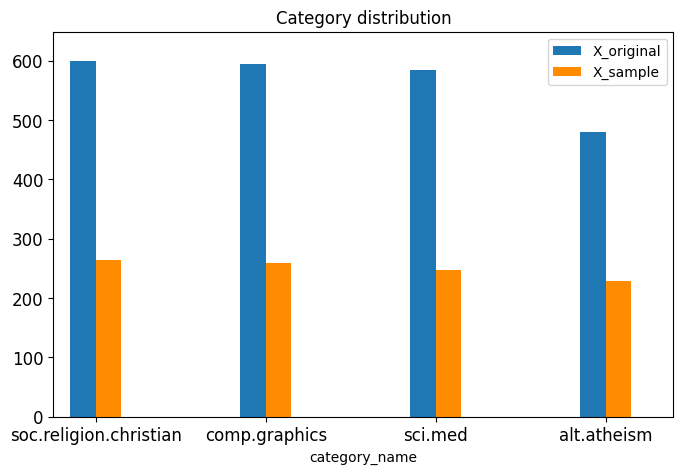

In [25]:
import matplotlib.pyplot as plt

upper_bound = max(X.category_name.value_counts()) + 50
print(X_sample.category_name.value_counts())
plt.style.use('default')

ax = X.category_name.value_counts().plot(kind = 'bar',
                                    width = 0.15,
                                    position = 1,
                                    rot = 0,
                                    ylim = [0, upper_bound],
                                    fontsize = 12,
                                    label = 'X_original',
                                    figsize = (8,5))
X_sample.category_name.value_counts().plot(kind = 'bar',
                                                width = 0.15,
                                                position = 0,
                                                rot = 0,
                                                color = 'darkorange',
                                                fontsize = 12,
                                                label = 'X_sample',
                                                ax = ax)
plt.legend()
plt.title('Category distribution')

<hr>

### **>>> Exercise 5 (Lab1 / take home - Exercise 10):** 

We said that the `1` at the beginning of the fifth record represents the `00` term. Notice that there is another 1 in the same record. Can you provide code that can verify what word this 1 represents from the vocabulary. Try to do this as efficient as possible.

In [26]:
from sklearn.feature_extraction.text import CountVectorizer

count_vect = CountVectorizer()
X_counts = count_vect.fit_transform(X.text) # learn the vocabulary and return document-term matrix
print(X_counts[0]) # (0, 123) 5 -> represent the word with id 123 appears 5 time in the first document

  (np.int32(0), np.int32(14887))	1
  (np.int32(0), np.int32(29022))	1
  (np.int32(0), np.int32(8696))	4
  (np.int32(0), np.int32(4017))	2
  (np.int32(0), np.int32(33256))	2
  (np.int32(0), np.int32(21661))	3
  (np.int32(0), np.int32(9031))	3
  (np.int32(0), np.int32(31077))	1
  (np.int32(0), np.int32(9805))	2
  (np.int32(0), np.int32(17366))	1
  (np.int32(0), np.int32(32493))	4
  (np.int32(0), np.int32(16916))	2
  (np.int32(0), np.int32(19780))	2
  (np.int32(0), np.int32(17302))	2
  (np.int32(0), np.int32(23122))	1
  (np.int32(0), np.int32(25663))	1
  (np.int32(0), np.int32(16881))	1
  (np.int32(0), np.int32(16082))	1
  (np.int32(0), np.int32(23915))	1
  (np.int32(0), np.int32(32142))	5
  (np.int32(0), np.int32(33597))	2
  (np.int32(0), np.int32(20253))	1
  (np.int32(0), np.int32(587))	1
  (np.int32(0), np.int32(12051))	1
  (np.int32(0), np.int32(5201))	1
  :	:
  (np.int32(0), np.int32(25361))	1
  (np.int32(0), np.int32(25337))	1
  (np.int32(0), np.int32(12833))	2
  (np.int32(0), np.in

In [27]:
# get the first 10 words, '00' represent the first word, '000' represent the second word, and so on

count_vect.get_feature_names_out()[0:10]

array(['00', '000', '0000', '0000001200', '000005102000', '0001',
       '000100255pixel', '00014', '000406', '0007'], dtype=object)

In [28]:
# show the times of appearance of the first 100 words in the first 5 documents

X_counts[0:5, 0:100].toarray()

array([[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0,

In [29]:
# For the first 5 documents, print those words that the times of appearance is 1 for the first 100 words

for i in range(5):
    # Get the words that appear in the first 100 words
    print('the', i+1, '-th document : ', count_vect.inverse_transform(X_counts[i, 0:100].toarray())[0].tolist()) 

the 1 -th document :  []
the 2 -th document :  []
the 3 -th document :  []
the 4 -th document :  []
the 5 -th document :  ['00', '01']


<hr>

### **>>> Exercise 6 (Lab1 / take home - Exercise 11):** 

From the chart below, we can see how sparse the term-document matrix is; i.e., there is only one terms with **FREQUENCY** of `1` in the subselection of the matrix. By the way, you may have noticed that we only selected 20 articles and 20 terms to plot the histrogram. As an excersise you can try to modify the code above to plot the entire term-document matrix or just a sample of it. How would you do this efficiently? Remember there is a lot of words in the vocab. Report below what methods you would use to get a nice and useful visualization

In [30]:
# get the first 20 words

plot_x = ["term_"+str(i) for i in count_vect.get_feature_names_out()[0:20]]
plot_x

['term_00',
 'term_000',
 'term_0000',
 'term_0000001200',
 'term_000005102000',
 'term_0001',
 'term_000100255pixel',
 'term_00014',
 'term_000406',
 'term_0007',
 'term_000usd',
 'term_0010',
 'term_001004',
 'term_0010580b',
 'term_001125',
 'term_001200201pixel',
 'term_0014',
 'term_001642',
 'term_00196',
 'term_002']

In [31]:
# get the index of the first 20 documents

plot_y = ["doc_"+ str(i) for i in list(X.index)[0:20]] 
plot_y

['doc_0',
 'doc_1',
 'doc_2',
 'doc_3',
 'doc_4',
 'doc_5',
 'doc_6',
 'doc_7',
 'doc_8',
 'doc_9',
 'doc_10',
 'doc_11',
 'doc_12',
 'doc_13',
 'doc_14',
 'doc_15',
 'doc_16',
 'doc_17',
 'doc_18',
 'doc_19']

In [32]:
# get the appearance times of the first 20 words in the first 20 documents
# toarray() is used to convert sparse matrix to normal matrix
 
plot_z = X_counts[0:20, 0:20].toarray()
plot_z

array([[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 0,

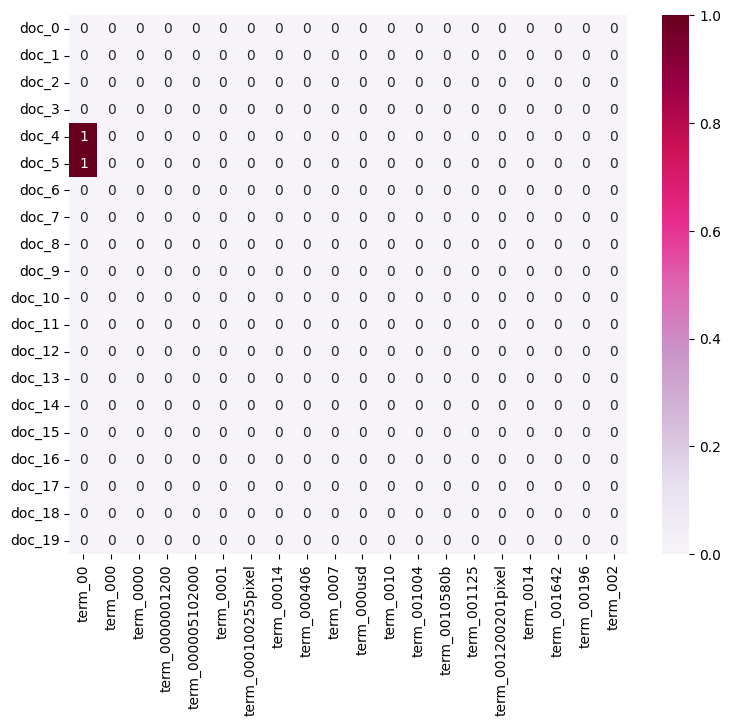

In [33]:
import seaborn as sns

df_todraw = pd.DataFrame(plot_z, columns = plot_x, index = plot_y)

plt.subplots(figsize=(9, 7))
ax = sns.heatmap(df_todraw, cmap="PuRd", vmin=0, vmax=1, annot=True)

# The graph is too sparse

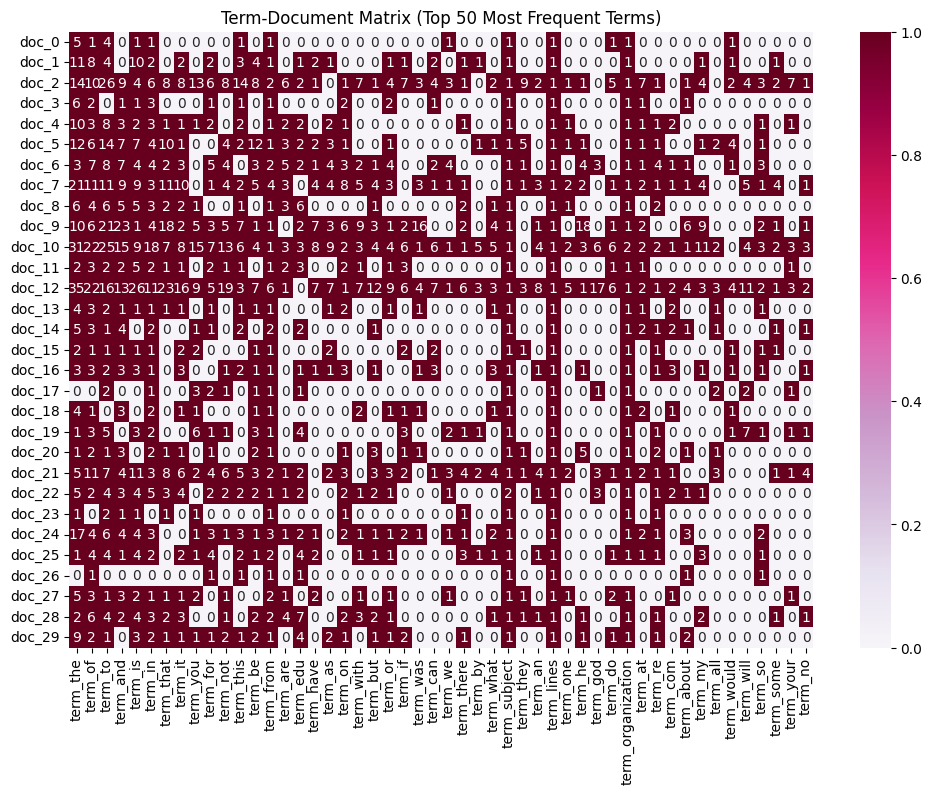

In [35]:
# get the appearance times of the first 50 words in the first 30 documents
term_frequencies = X_counts.sum(axis=0).A1

# get the index of the top 50 words
top_terms_idx = term_frequencies.argsort()[-50:][::-1]

plot_x_2 = ["term_"+str(i) for i in count_vect.get_feature_names_out()[top_terms_idx]]
plot_y_2 = ["doc_"+ str(i) for i in list(X.index)[0:30]]
plot_z_2 = X_counts[0:30, top_terms_idx].toarray()

df_todraw_2 = pd.DataFrame(plot_z_2, columns = plot_x_2, index = plot_y_2)
plt.figure(figsize=(12, 8))
ax_2 = sns.heatmap(df_todraw_2, cmap="PuRd", vmin=0, vmax=1, annot=True)
plt.title("Term-Document Matrix (Top 50 Most Frequent Terms)")
plt.xticks(rotation = 90)
plt.show()

# Choose the top 50 words from all the words, we can see that the graph is more dense now

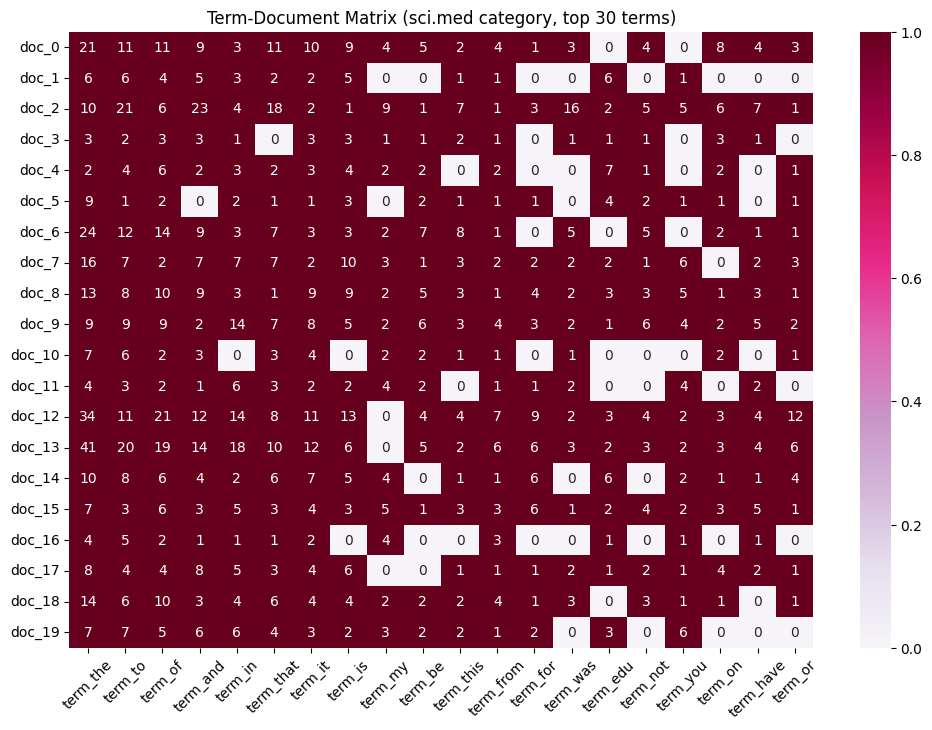

In [36]:
# Or we can choose the specific category to see the top 50 words in that category
category_docs = X[X['category_name'] == 'sci.med'].index[:20]

# get the appearance times of the top 50 words in the first 20 documents of the category 'sci.med'
category_terms = X_counts[category_docs].sum(axis=0).A1
top_category_terms = category_terms.argsort()[-20:][::-1]

plot_x_3 = ["term_"+str(i) for i in count_vect.get_feature_names_out()[top_category_terms]]
plot_y_3 = ["doc_"+ str(i) for i in range(len(category_docs[:20]))]
plot_z_3 = X_counts[category_docs][:, top_category_terms].toarray()

df_todraw_3 = pd.DataFrame(plot_z_3, columns = plot_x_3, index = plot_y_3)
plt.figure(figsize=(12, 8))
ax_3 = sns.heatmap(df_todraw_3, cmap="PuRd", vmin=0, vmax=1, annot=True)
plt.title("Term-Document Matrix (sci.med category, top 30 terms)")
plt.xticks(rotation = 45)
plt.show()

<hr>

### **>>> Exercise 7 (Lab1 / take home - Exercise 12):** 

If you want a nicer interactive visualization here, I would encourage you try to install and use plotly to achieve this.

In [37]:
# store the appearance times of each word
term_frequencies = []
for j in range(0,X_counts.shape[1]):
    term_frequencies.append(sum(X_counts[:,j].toarray()))

term_frequencies

[array([134]),
 array([92]),
 array([1]),
 array([2]),
 array([1]),
 array([3]),
 array([1]),
 array([1]),
 array([1]),
 array([1]),
 array([2]),
 array([1]),
 array([1]),
 array([3]),
 array([1]),
 array([1]),
 array([1]),
 array([2]),
 array([1]),
 array([3]),
 array([1]),
 array([2]),
 array([1]),
 array([1]),
 array([1]),
 array([2]),
 array([1]),
 array([1]),
 array([1]),
 array([1]),
 array([1]),
 array([1]),
 array([1]),
 array([1]),
 array([5]),
 array([1]),
 array([13]),
 array([95]),
 array([4]),
 array([1]),
 array([1]),
 array([1]),
 array([1]),
 array([1]),
 array([2]),
 array([1]),
 array([1]),
 array([1]),
 array([2]),
 array([1]),
 array([1]),
 array([1]),
 array([1]),
 array([2]),
 array([1]),
 array([1]),
 array([1]),
 array([4]),
 array([2]),
 array([1]),
 array([1]),
 array([1]),
 array([1]),
 array([1]),
 array([2]),
 array([1]),
 array([1]),
 array([1]),
 array([1]),
 array([1]),
 array([2]),
 array([1]),
 array([59]),
 array([1]),
 array([4]),
 array([2]),
 array

In [38]:
# convert the list to numpy array

term_frequencies = np.asarray(X_counts.sum(axis=0))[0]
term_frequencies

array([134,  92,   1, ...,   1,   1,   1])

In [39]:
# print the sum of the first word '00' in all documents

term_frequencies[0]

np.int64(134)

C:\Users\USER\AppData\Local\Temp\ipykernel_920\2435611768.py:6: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  g.set_xticklabels(count_vect.get_feature_names_out()[:300], rotation = 90);


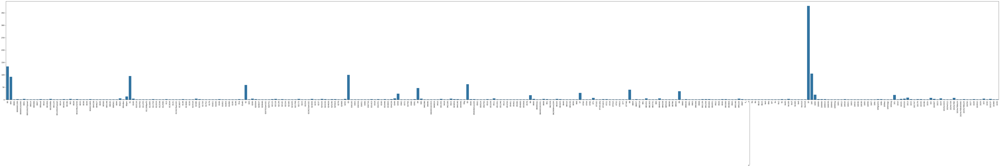

In [40]:
# After aggregating all the frequencies across all documents

plt.subplots(figsize=(100, 10))
g = sns.barplot(x=count_vect.get_feature_names_out()[:300], y=term_frequencies[:300])
g.set_xticklabels(count_vect.get_feature_names_out()[:300], rotation = 90);

In [41]:
# to have a nicer interactive plot, use plotly

import plotly.express as px

fig_0 = px.bar(x=count_vect.get_feature_names_out()[:300], y=term_frequencies[:300])
fig_0.update_layout(xaxis={'categoryorder':'category ascending'}) # 'total descending' represents the order of the x-axis is based on the total frequency of the terms
fig_0.show()

<hr>

### **>>> Exercise 8 (Lab1 / take home - Exercise 13):** 

The chart above only contains 300 vocabulary in the documents, and it's already computationally intensive to both compute and visualize. Can you efficiently reduce the number of terms you want to visualize as an exercise. 

In [42]:
# Method 1: by using numpy.argsort() to get the top N terms

N = 50  # number of top terms
top_indices = np.argsort(term_frequencies)[-N:]  # get the indices of the top N terms
top_terms = count_vect.get_feature_names_out()[top_indices]
top_freqs = term_frequencies[top_indices]

fig_1 = px.bar(x=top_terms, y=top_freqs)
fig_1.update_layout(
    xaxis={'categoryorder':'total descending'},
    title='Top 50 Most Frequent Terms',
    xaxis_title='Terms',
    yaxis_title='Frequency'
)
fig_1.show()

# It's the simplest and most direct way, but it may miss some important terms that are not the most frequent

In [43]:
# Method 2: by setting a threshold

threshold = np.mean(term_frequencies) + np.std(term_frequencies)  # set the threshold as mean + std
mask = term_frequencies > threshold
filtered_terms = count_vect.get_feature_names_out()[mask]
filtered_freqs = term_frequencies[mask]

fig_2 = px.bar(x=filtered_terms, y=filtered_freqs)
fig_2.update_layout(
    xaxis={'categoryorder':'total descending'},
    title=f'Terms with Frequency > {threshold:.0f}',
    xaxis_title='Terms',
    yaxis_title='Frequency'
)
fig_2.show()

# Based on the dynamic threshold of the data distribution, it is more flexible

<hr>

### **>>> Exercise 9 (Lab1 / take home - Exercise 14):** 

Additionally, you can attempt to sort the terms on the `x-axis` by frequency instead of in alphabetical order. This way the visualization is more meaninfgul and you will be able to observe the so called [long tail](https://en.wikipedia.org/wiki/Long_tail) (get familiar with this term since it will appear a lot in data mining and other statistics courses). see picture below

![alt txt](https://upload.wikimedia.org/wikipedia/commons/thumb/8/8a/Long_tail.svg/1000px-Long_tail.svg.png)

In [45]:
# Use 'total descending' to sort the x-axis

import plotly.express as px

fig_4 = px.bar(x=count_vect.get_feature_names_out()[:200], y=term_frequencies[:200])
fig_4.update_layout(xaxis={'categoryorder':'total descending'}) 
fig_4.show()

<hr>

### **>>> Exercise 10 (Lab1 / take home - Exercise 15):** 

You can copy the code from the previous exercise and change the 'term_frequencies' variable for the 'term_frequencies_log', comment about the differences that you observe and talk about other possible insights that we can get from a log distribution.

C:\Users\USER\AppData\Local\Temp\ipykernel_920\3604587163.py:5: UserWarning:

set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.



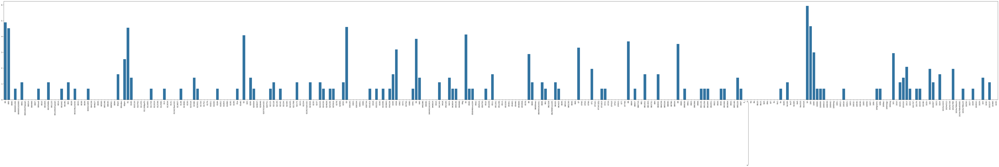

In [46]:
import math
term_frequencies_log = [math.log(i) for i in term_frequencies]
plt.subplots(figsize=(100, 10))
g = sns.barplot(x=count_vect.get_feature_names_out()[:300], y=term_frequencies_log[:300])
g.set_xticklabels(count_vect.get_feature_names_out()[:300], rotation = 90);

# the difference between the two plots is that the y-axis of the second plot is the log of the frequency of the terms,
# which can help to reduce the impact of the high frequency terms, and make the plot more readable,
# especially when the frequency of the terms is highly skewed.

C:\Users\USER\AppData\Local\Temp\ipykernel_920\2106963920.py:14: UserWarning:

set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.



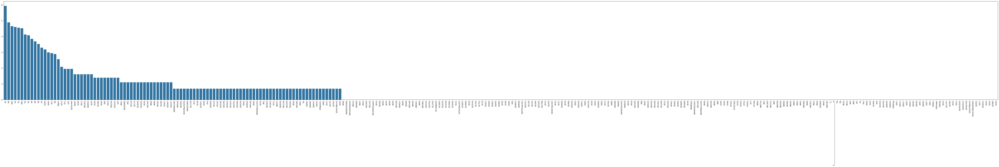

In [47]:
# Combine term and frequency into a list and sort by frequency
terms_and_frequencies = sorted(zip(
    count_vect.get_feature_names_out()[:300], 
    term_frequencies_log[:300]
    ), key=lambda x: x[1], reverse=True)

# Separate the terms and frequencies
sorted_terms = [term for term, freq in terms_and_frequencies]
sorted_frequencies = [freq for term, freq in terms_and_frequencies]

plt.subplots(figsize=(100, 10))
g = sns.barplot(x=sorted_terms, y=sorted_frequencies)
g.set_xticklabels(sorted_terms, rotation=90)
plt.show()

<hr>

### **>>> Exercise 11 (Lab1 / take home - Exercise 16):** 

Review the words that were filtered in each category and comment about the differences and similarities that you can see.

In [48]:
# Create separate DataFrames for each category
categories = X['category_name'].unique()  # Get unique category labels
category_dfs = {}  # Dictionary to store DataFrames for each category

for category in categories:
    # Filter the original DataFrame by category
    category_dfs[category] = X[X['category_name'] == category].copy()

# Function to create term-document frequency DataFrame for each category
def create_term_document_df(df):
    count_vect = CountVectorizer()  # Initialize the CountVectorizer 
    X_counts = count_vect.fit_transform(df['text'])  # Transform the text data into word counts
    
    # Get the unique words (vocabulary) from the vectorizer
    words = count_vect.get_feature_names_out()
    
    # Create a DataFrame where rows are documents and columns are words
    term_document_df = pd.DataFrame(X_counts.toarray(), columns=words)
    
    return term_document_df

# Create term-document frequency DataFrames for each category
filt_term_document_dfs = {}  # Dictionary to store term-document DataFrames for each category 

for category in categories:
    filt_term_document_dfs[category] = create_term_document_df(category_dfs[category])

In [49]:
# for example, term_document_dfs[category] represents the dataframe of 584 articles of category 'comp.graphics' * 13756 words,
# term_document_dfs['comp.graphics'] this can show the first 5 records of the dataframe

# Display the term-document frequency DataFrame for the selected category
for i in range(len(categories)):
    print(f"Filtered Term-Document Frequency DataFrame for Category {categories[i]}:")
    display(filt_term_document_dfs[categories[i]]) 

Filtered Term-Document Frequency DataFrame for Category comp.graphics:


,00,000,000005102000,000100255pixel,0007,000usd,0010580b,001200201pixel,00196,002,...,zorn,zrz,zsoft,zt,zug,zurich,zvi,zyeh,zyxel,ªl
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
579,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
580,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
581,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
582,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


Filtered Term-Document Frequency DataFrame for Category soc.religion.christian:


,00,000,0001,0014,00630,01,0131,01580,02,02173,...,zebedee,zechariah,zeitschrift,zeke,zero,zeta,zilch,zoerasterism,zorasterism,zwart
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,2
2,1,0,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
594,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
595,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
596,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
597,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


Filtered Term-Document Frequency DataFrame for Category sci.med:


,00,000,0000,0000001200,00014,0010,001004,001642,003258u19250,0033,...,zoloft,zonal,zone,zonker,zooid,zubkoff,zurich,zz,zzz,íålittin
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
589,0,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
590,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
591,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
592,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


Filtered Term-Document Frequency DataFrame for Category alt.atheism:


,00,000,000406,001125,01,0100,010116,011255,012536,013034,...,zlumber,zombie,zoo,zues,zumder,zur,zurlo,zus,zvonko,zyklon
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
475,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
476,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
477,0,0,0,0,0,0,0,0,0,0,...,2,0,0,0,0,0,0,0,0,0
478,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


the words that were filtered in category `comp.graphics`

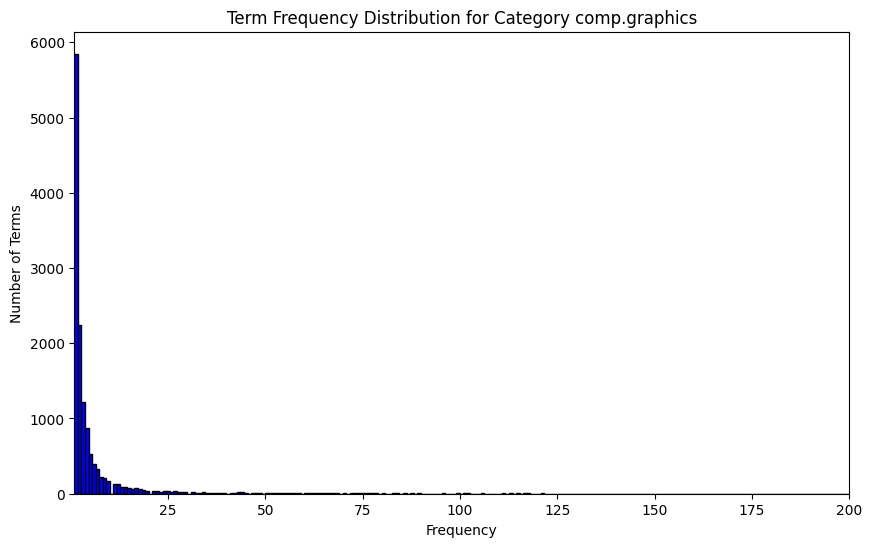

In [50]:
# want to know the distribution of words per category,
# because want to know the amount of common words that eah category has and the amout of rare words

# Sum over all documents to get total frequency for each word
category_number = 0 # You can change it from 0 to 3
# word counts represent the frequency of each word in the category : [34 17  1 ... 10  2  1]
word_counts = filt_term_document_dfs[categories[category_number]].sum(axis=0).to_numpy() 

# Visualize the frequency distribution 
plt.figure(figsize=(10, 6))
plt.hist(word_counts, bins=5000, color='blue', edgecolor='black')
plt.title(f'Term Frequency Distribution for Category {categories[category_number]}')
plt.xlabel('Frequency')
plt.ylabel('Number of Terms')
plt.xlim(1, 200)
plt.show()

# we can filter out the words that are in the top 5% and bottom 1% of the frequency distribution
# since these words may not be very informative

# this graph shows the frequency distribution of words in the category 'comp.graphics',
# which means the number of times each word appears in all articles,

In [51]:
# Filter the bottom 1% and top 5% words based on their sum across all documents
def filter_top_bottom_words_by_sum(term_document_df, top_percent=0.05, bottom_percent=0.01):
    # Calculate the sum of each word across all documents
    word_sums = term_document_df.sum(axis=0)
    
    # Sort the words by their total sum
    sorted_words = word_sums.sort_values()
    
    # Calculate the number of words to remove
    total_words = len(sorted_words)
    top_n = int(top_percent * total_words)
    bottom_n = int(bottom_percent * total_words)
    
    # Get the words to remove from the top 5% and bottom 1%
    words_to_remove = pd.concat([sorted_words.head(bottom_n), sorted_words.tail(top_n)]).index
    # Here we print which words correspond to the bottom percentage we filter
    print(f'Bottom {bottom_percent*100}% words: \n{sorted_words.head(bottom_n)}')
    # Here we print which words correspond to the top percentage we filter
    print('\n')
    print(f'Top {top_percent*100}% words: \n{sorted_words.tail(top_n)}') 
    # Return the DataFrame without the filtered words
    return term_document_df.drop(columns=words_to_remove)

In [52]:
# Apply the filtering function to each category
term_document_dfs = {} # Dictionary to store filtered term-document DataFrames for each category
category_number = 0 

print(f'\nFor category {categories[category_number]} we filter the following words: \n')
# Filter the words for the selected category
term_document_dfs[categories[category_number]] = filter_top_bottom_words_by_sum(filt_term_document_dfs[categories[category_number]])

print('\n')
print(f"Filtered Term-Document Frequency DataFrame for Category {categories[category_number]}:")
# Display the filtered term-document frequency DataFrame for the selected category
term_document_dfs[categories[category_number]] 


For category comp.graphics we filter the following words: 

Bottom 1.0% words: 
0039              1
0038              1
0028              1
00196             1
001200201pixel    1
                 ..
10fps             1
10665             1
1066              1
xwindow           1
xwdtopnm          1
Length: 137, dtype: int64


Top 5.0% words: 
further      27
ii           27
27           27
martin       27
multi        27
           ... 
is         1751
and        2382
of         2470
to         2775
the        4537
Length: 687, dtype: int64


Filtered Term-Document Frequency DataFrame for Category comp.graphics:


,000,000005102000,000100255pixel,0007,000usd,0010580b,002,0094,00index,00pm,...,zopfi,zorg,zorn,zrz,zsoft,zt,zug,zurich,zyeh,zyxel
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
579,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
580,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
581,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
582,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [53]:
term_document_dfs = {} 
category_number = 1

print(f'\nFor category {categories[category_number]} we filter the following words: \n')
term_document_dfs[categories[category_number]] = filter_top_bottom_words_by_sum(filt_term_document_dfs[categories[category_number]])

print('\n')
print(f"Filtered Term-Document Frequency DataFrame for Category {categories[category_number]}:")
term_document_dfs[categories[category_number]] 


For category soc.religion.christian we filter the following words: 

Bottom 1.0% words: 
0706           1
zeitschrift    1
zeal           1
zara           1
yves           1
              ..
prevented__    1
prevented      1
prevelant      1
preeminence    1
predicts       1
Length: 138, dtype: int64


Top 5.0% words: 
pagan         36
mmalt         36
reject        36
friend        36
parents       37
           ...  
that        4393
and         4409
to          6113
of          6377
the        11200
Length: 693, dtype: int64


Filtered Term-Document Frequency DataFrame for Category soc.religion.christian:


,000,0001,01580,02173,0349,0358,04,0510,0511,06,...,za,zealand,zebedee,zechariah,zeke,zero,zilch,zoerasterism,zorasterism,zwart
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,2
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,1,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
594,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
595,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
596,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
597,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [54]:
term_document_dfs = {}
category_number = 2 

print(f'\nFor category {categories[category_number]} we filter the following words: \n')
term_document_dfs[categories[category_number]] = filter_top_bottom_words_by_sum(filt_term_document_dfs[categories[category_number]])

print('\n')
print(f"Filtered Term-Document Frequency DataFrame for Category {categories[category_number]}:")
term_document_dfs[categories[category_number]] 


For category sci.med we filter the following words: 

Bottom 1.0% words: 
zz         1
zubkoff    1
zooid      1
zone       1
zonal      1
          ..
1263       1
125920     1
125545     1
1356       1
134848     1
Length: 162, dtype: int64


Top 5.0% words: 
genetic           29
nye               29
haven             29
experimental      29
appreciated       29
                ... 
in              2993
and             3450
to              4085
of              4560
the             6854
Length: 812, dtype: int64




Filtered Term-Document Frequency DataFrame for Category sci.med:


,0000001200,001004,001642,003258u19250,0033,004021809,004158,004627,00500,00am,...,zero,zeus,zhou,zikopoulos,zinc,zion,zip,zmodem,zonker,zurich
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
589,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
590,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
591,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
592,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [55]:
term_document_dfs = {}
category_number = 3 

print(f'\nFor category {categories[category_number]} we filter the following words: \n')
term_document_dfs[categories[category_number]] = filter_top_bottom_words_by_sum(filt_term_document_dfs[categories[category_number]])

print('\n')
print(f"Filtered Term-Document Frequency DataFrame for Category {categories[category_number]}:")
term_document_dfs[categories[category_number]] 


For category alt.atheism we filter the following words: 

Bottom 1.0% words: 
050750       1
0511         1
051246       1
06           1
011255       1
            ..
128          1
yohan        1
yoke         1
yorktown     1
youngster    1
Length: 119, dtype: int64


Top 5.0% words: 
gmt         36
place       37
days        37
jewish      37
beyond      37
          ... 
that      3158
is        3530
to        4249
of        4253
the       7234
Length: 598, dtype: int64




Filtered Term-Document Frequency DataFrame for Category alt.atheism:


,00,000,01,0100,015931,02,020504,023044,024150,025924,...,zeroed,zeus,zillions,zion,zionist,zip,zlumber,zombie,zoo,zurlo
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
475,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
476,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
477,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,2,0,0,0
478,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


The filtered words show that all categories have common high-frequency words like "the," "of," and "to," which are typical English stop words. However, each category also has its own unique terms, such as "pixel" and "xwindow" in comp.graphics and "pagan" and "parents" in soc.religion.christian. This means that while the categories share some common words, they also have specific vocabulary related to their topics. The presence of these common stop words suggests that the language structure remains similar across different categories.

<hr>

### **>>> Exercise 12 (Lab1 / take home - Exercise 17):** 

Implement the FAE Top-K and MaxFPGrowth algorithms from the PAMI library to analyze the 'comp.graphics' category in our processed database. **Only implement the mining part of the algorithm and display the resulting patterns**, like we did with the FPGrowth algorithm after creating the new databases. For the FAE Top-K, run trials with k values of 500, 1000, and 1500, recording the runtime for each. For MaxFPGrowth, test minimum support thresholds of 3, 6, and 9, noting the runtime for these settings as well. Compare the patterns these algorithms extract with those from the previously implemented FPGrowth algorithm. Document your findings, focusing on differences and similarities in the outputs and performance.

In [56]:
from PAMI.frequentPattern.basic import FPGrowth as alg
minSup=9 
obj1 = alg.FPGrowth(iFile='td_freq_db_sci_med.csv', minSup=minSup) 
obj1.mine() # mine the frequent patterns 
frequentPatternsDF_sci_med= obj1.getPatternsAsDataFrame() 
print('Total No of patterns: ' + str(len(frequentPatternsDF_sci_med))) 
print('Runtime: ' + str(obj1.getRuntime())) #measure the runtime
obj1.save('freq_patterns_sci_med_minSup9.txt')
frequentPatternsDF_sci_med

Frequent patterns were generated successfully using frequentPatternGrowth algorithm
Total No of patterns: 10000
Runtime: 0.2591369152069092


,Patterns,Support
0,leave,9
1,swell,9
2,color,9
3,confused,9
4,learning,9
...,...,...
9995,means,27
9996,haven,27
9997,happen,27
9998,originator,27


In [57]:
from PAMI.frequentPattern.basic import FPGrowth as alg
minSup=9
obj2 = alg.FPGrowth(iFile='td_freq_db_alt_atheism.csv', minSup=minSup)
obj2.mine()
frequentPatternsDF_alt_atheism= obj2.getPatternsAsDataFrame()
print('Total No of patterns: ' + str(len(frequentPatternsDF_alt_atheism))
print('Runtime: ' + str(obj2.getRuntime()))
obj2.save('freq_patterns_alt_atheism_minSup9.txt')
frequentPatternsDF_alt_atheism

Frequent patterns were generated successfully using frequentPatternGrowth algorithm
Total No of patterns: 4676
Runtime: 0.3286275863647461


,Patterns,Support
0,choices,9
1,corp,9
2,hausmann,9
3,hausmann maddi,9
4,kids,9
...,...,...
4671,date,31
4672,date gmt,19
4673,stay,32
4674,snm6394,32


In [58]:
from PAMI.frequentPattern.basic import FPGrowth as alg
minSup=9
obj3 = alg.FPGrowth(iFile='td_freq_db_comp_graphics.csv', minSup=minSup)
obj3.mine()
frequentPatternsDF_comp_graphics= obj3.getPatternsAsDataFrame()
print('Total No of patterns: ' + str(len(frequentPatternsDF_comp_graphics)))
print('Runtime: ' + str(obj3.getRuntime()))
obj3.save('freq_patterns_comp_graphics_minSup9.txt')
frequentPatternsDF_comp_graphics

Frequent patterns were generated successfully using frequentPatternGrowth algorithm
Total No of patterns: 33574
Runtime: 0.2592203617095947


,Patterns,Support
0,individual,9
1,certain,9
2,hall,9
3,mike,9
4,vr,9
...,...,...
33569,life,24
33570,ideas,24
33571,feel,24
33572,tried,24


In [59]:
from PAMI.frequentPattern.basic import FPGrowth as alg
minSup=9
obj4 = alg.FPGrowth(iFile='td_freq_db_soc_religion_christian.csv', minSup=minSup)
obj4.mine()
frequentPatternsDF_soc_religion_christian= obj4.getPatternsAsDataFrame()
print('Total No of patterns: ' + str(len(frequentPatternsDF_soc_religion_christian))) #print the total number of patterns
print('Runtime: ' + str(obj4.getRuntime()))
obj4.save('freq_patterns_soc_religion_minSup9.txt')
frequentPatternsDF_soc_religion_christian

Frequent patterns were generated successfully using frequentPatternGrowth algorithm
Total No of patterns: 11213
Runtime: 0.6618776321411133


,Patterns,Support
0,latest,9
1,san,9
2,seven,9
3,schools,9
4,chose,9
...,...,...
11208,34,33
11209,institute,33
11210,ways,33
11211,oh,34


<hr>

In [60]:
from PAMI.frequentPattern.topk.FAE import FAE as alg

k_values = [500, 1000, 1500]

for k in k_values:
    print(f"Running FAE Top-K with k={k}")
    
    obj_topk = alg(iFile='td_freq_db_comp_graphics.csv', k=k)
    obj_topk.mine()
    frequentPatternsDF_topk = obj_topk.getPatternsAsDataFrame() # get the frequent patterns as DataFrame
    print(f"Total No of patterns with k={k}: " + str(len(frequentPatternsDF_topk)))
    print(f"Runtime with k={k}: " + str(obj_topk.getRuntime()))
    obj_topk.save(f'pattern/topk/freq_patterns_comp_graphics_topk_{k}.txt')
    
    display(frequentPatternsDF_topk)

Running FAE Top-K with k=500
 TopK frequent patterns were successfully generated using FAE algorithm.
Total No of patterns with k=500: 500
Runtime with k=500: 4.182967901229858


,Patterns,Support
0,maybe,26
1,life,24
2,ideas,24
3,feel,24
4,tried,24
...,...,...
495,awful posts curious concerning proposed learn ...,12
496,posts curious concerning proposed learn forum ...,12
497,convenience posts curious concerning proposed ...,12
498,posts curious concerning proposed learn forum ...,12


Running FAE Top-K with k=1000
 TopK frequent patterns were successfully generated using FAE algorithm.
Total No of patterns with k=1000: 1000
Runtime with k=1000: 5.183506011962891


,Patterns,Support
0,maybe,26
1,life,24
2,ideas,24
3,feel,24
4,tried,24
...,...,...
995,favor proposed forum personally feel wate,12
996,proposed forum personally feel favor,12
997,convenience awful discussing posts curious con...,12
998,awful discussing posts curious concerning prop...,12


Running FAE Top-K with k=1500
 TopK frequent patterns were successfully generated using FAE algorithm.
Total No of patterns with k=1500: 1500
Runtime with k=1500: 9.913976907730103


,Patterns,Support
0,maybe,26
1,life,24
2,ideas,24
3,feel,24
4,tried,24
...,...,...
1495,awful discussing favor proposed learn personal...,12
1496,discussing favor proposed learn personally fee...,12
1497,convenience discussing favor proposed learn pe...,12
1498,discussing favor proposed learn personally fee...,12


In [62]:
from PAMI.frequentPattern.maximal import MaxFPGrowth as alg

min_supports = [3, 6, 9]

for min_sup in min_supports:
    print(f"Running MaxFPGrowth with minSup={min_sup}")
    obj_maxfp = alg.MaxFPGrowth(iFile='td_freq_db_comp_graphics.csv', minSup=min_sup)
    obj_maxfp.mine()
    frequentPatternsDF_maxfp = obj_maxfp.getPatternsAsDataFrame() # get the frequent patterns as DataFrame
    print(f"Total No of patterns with minSup={min_sup}: " + str(len(frequentPatternsDF_maxfp)))
    print(f"Runtime with minSup={min_sup}: " + str(obj_maxfp.getRuntime()))
    obj_maxfp.save(f'pattern/maxfp/freq_patterns_comp_graphics_maxfp_minSup{min_sup}.txt')
    
    display(frequentPatternsDF_maxfp)


Running MaxFPGrowth with minSup=3
Maximal Frequent patterns were generated successfully using MaxFp-Growth algorithm 
Total No of patterns with minSup=3: 6872
Runtime with minSup=3: 60.9313280582428


,Patterns,Support
0,due bytes responsible 000 opinion 640x480 rob ...,3
1,bag,3
2,garbo uwasa,3
3,wrong 200 responsible 000 umn 480 640 tc,3
4,responsible 000 essex,3
...,...,...
6867,didn wondering,3
6868,feel wrong personally,3
6869,wrong correct,3
6870,life correct,3


Running MaxFPGrowth with minSup=6
Maximal Frequent patterns were generated successfully using MaxFp-Growth algorithm 
Total No of patterns with minSup=6: 1340
Runtime with minSup=6: 0.5167689323425293


,Patterns,Support
0,tim brock,6
1,face,6
2,pardon,6
3,removal silent assassin cellar tsa,6
4,creative,6
...,...,...
1335,feel apr,8
1336,didn,22
1337,wrong,23
1338,tried,24


Running MaxFPGrowth with minSup=9
Maximal Frequent patterns were generated successfully using MaxFp-Growth algorithm 
Total No of patterns with minSup=9: 660
Runtime with minSup=9: 0.1388254165649414


,Patterns,Support
0,tim,9
1,option,9
2,rumours 68070,9
3,chip,9
4,rumours mcmains unt,9
...,...,...
655,wrong,23
656,tried,24
657,ideas,24
658,life,24


- In the comp.graphics category, the number of frequent patterns mined by FAE Top-K and MaxFPGrowth will be less than FPGrowth

- And from the result, we can see that as the k value increases, the number of frequent patterns mined by FAE Top-K will also increase, while MaxFPGrowth will decrease as the min

- From the performance point of view, FAE Top-K and MaxFPGrowth can find more frequent patterns in a shorter time

<hr>

### **>>> Exercise 13 (Lab1 / take home - Exercise 18):** 

Please try to reduce the dimension to 3, and plot the result use 3-D plot. Use at least 3 different angle (camera position) to check your result and describe what you found.

$Hint$: you can refer to Axes3D in the documentation.

In [64]:
import pandas as pd

# We group together all of the dataframes related to our found patterns
dfs = [frequentPatternsDF_sci_med, frequentPatternsDF_soc_religion_christian, frequentPatternsDF_comp_graphics, frequentPatternsDF_alt_atheism]


# Identify patterns that appear in more than one category
# Count how many times each pattern appears across all dataframes
pattern_counts = {}
for df in dfs:
    for pattern in df['Patterns']:
        if pattern not in pattern_counts:
            pattern_counts[pattern] = 1
        else:
            pattern_counts[pattern] += 1

# Filter out patterns that appear in more than one dataframe
unique_patterns = {pattern for pattern, count in pattern_counts.items() if count == 1}
# Calculate the total number of patterns across all categories
total_patterns_count = sum(len(df) for df in dfs)
# Calculate how many patterns were discarded
discarded_patterns_count = total_patterns_count - len(unique_patterns)

# For each category, filter the patterns to keep only the unique ones
filtered_dfs = []
for df in dfs:
    filtered_df = df[df['Patterns'].isin(unique_patterns)]
    filtered_dfs.append(filtered_df)

# Merge the filtered dataframes into a final dataframe
final_pattern_df = pd.concat(filtered_dfs, ignore_index=True)

# Sort by support
final_pattern_df = final_pattern_df.sort_values(by='Support', ascending=False)

print(final_pattern_df)
print(f"Number of patterns discarded: {discarded_patterns_count}") # print the number of patterns discarded

         Patterns  Support
19912   institute       33
19911         gov       33
57158     snm6394       32
19910        form       31
19909          08       30
...           ...      ...
11        holland        9
10         deeply        9
9        unlikely        9
8      transplant        9
7       recurrent        9

[57159 rows x 2 columns]
Number of patterns discarded: 2304


In [65]:
import pandas as pd
from sklearn.feature_extraction.text import CountVectorizer

# Convert 'text' column into term-document matrix using CountVectorizer
count_vect = CountVectorizer()
X_tdm = count_vect.fit_transform(X['text'])  # X['text'] contains your text data
terms = count_vect.get_feature_names_out()  # Original terms in the vocabulary

# Tokenize the sentences into sets of unique words
X['tokenized_text'] = X['text'].str.split().apply(set)

# Initialize the pattern matrix
pattern_matrix = pd.DataFrame(0, index=X.index, columns=final_pattern_df['Patterns'])

# Iterate over each pattern and check if all words in the pattern are present in the tokenized sentence
for pattern in final_pattern_df['Patterns']:
    pattern_words = set(pattern.split())  # Tokenize pattern into words
    pattern_matrix[pattern] = X['tokenized_text'].apply(lambda x: 1 if pattern_words.issubset(x) else 0)

# Convert the term-document matrix to a DataFrame for easy merging
tdm_df = pd.DataFrame(X_tdm.toarray(), columns=terms, index=X.index)

# Concatenate the original TDM and the pattern matrix to augment the features
augmented_df = pd.concat([tdm_df, pattern_matrix], axis=1)

augmented_df

,00,000,0000,0000001200,000005102000,0001,000100255pixel,00014,000406,0007,...,192 means,quackery,newsreader pl8 tin,pl8 tin,pl8 newsreader,holland,deeply,unlikely,transplant,recurrent
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2252,0,0,0,0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0
2253,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0
2254,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2255,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [66]:
# 
# Applying dimensionality reduction with only the document-term frequency data
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
import umap.umap_ as umap
import matplotlib.pyplot as plt

# Apply PCA, t-SNE, and UMAP to the data
X_pca_tdm = PCA(n_components=2).fit_transform(tdm_df.values)
X_tsne_tdm = TSNE(n_components=2).fit_transform(tdm_df.values)
X_umap_tdm = umap.UMAP(n_components=2).fit_transform(tdm_df.values)

c:\Users\USER\AppData\Local\Programs\Python\Python39\lib\site-packages\tqdm\auto.py:21: TqdmWarning:

IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html



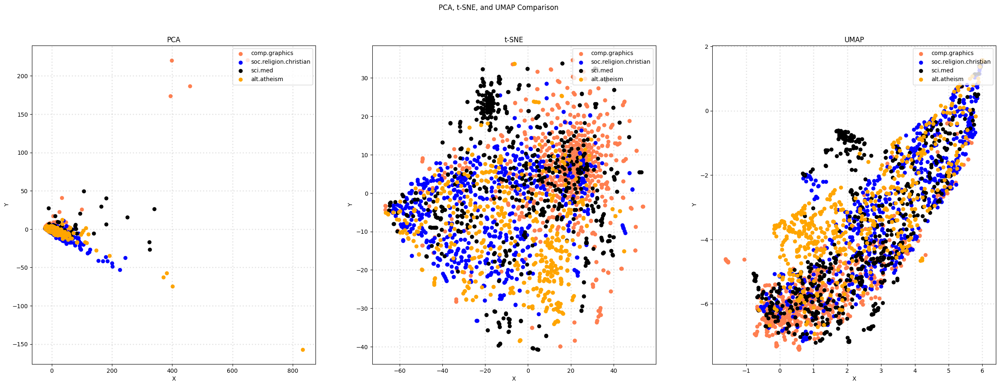

In [67]:
# Plot the results in subplots
col = ['coral', 'blue', 'black', 'orange']
categories = X['category_name'].unique() 

fig, axes = plt.subplots(1, 3, figsize=(30, 10))  # Create 3 subplots for PCA, t-SNE, and UMAP
fig.suptitle('PCA, t-SNE, and UMAP Comparison')

# Define a function to create a scatter plot for each method
def plot_scatter(ax, X_reduced, title):
    for c, category in zip(col, categories):
        xs = X_reduced[X['category_name'] == category].T[0]
        ys = X_reduced[X['category_name'] == category].T[1]
        ax.scatter(xs, ys, c=c, marker='o', label=category)
    
    ax.grid(color='gray', linestyle=':', linewidth=2, alpha=0.2)
    ax.set_title(title)
    ax.set_xlabel('X')
    ax.set_ylabel('Y')
    ax.legend(loc='upper right')

# Step 4: Create scatter plots for PCA, t-SNE, and UMAP
plot_scatter(axes[0], X_pca_tdm, 'PCA')
plot_scatter(axes[1], X_tsne_tdm, 't-SNE')
plot_scatter(axes[2], X_umap_tdm, 'UMAP')

plt.show()

In [68]:
# Applying dimensionality reduction with both the document-term frequency data and the pattern derived data
# Apply PCA, t-SNE, and UMAP to the data
X_pca_aug = PCA(n_components=2).fit_transform(augmented_df.values)
X_tsne_aug = TSNE(n_components=2).fit_transform(augmented_df.values)
X_umap_aug = umap.UMAP(n_components=2).fit_transform(augmented_df.values)

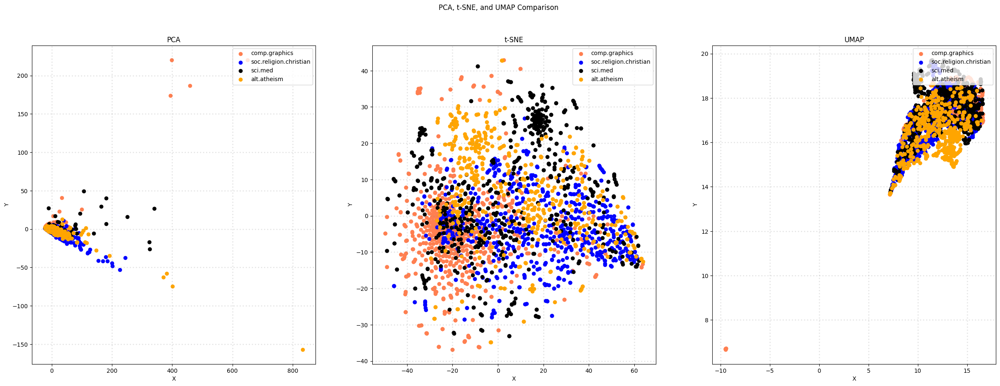

In [69]:
# Plot the results in subplots
col = ['coral', 'blue', 'black', 'orange']
categories = X['category_name'].unique() 

fig, axes = plt.subplots(1, 3, figsize=(30, 10))  # Create 3 subplots for PCA, t-SNE, and UMAP
fig.suptitle('PCA, t-SNE, and UMAP Comparison')

# Define a function to create a scatter plot for each method
def plot_scatter(ax, X_reduced, title):
    for c, category in zip(col, categories):
        xs = X_reduced[X['category_name'] == category].T[0]
        ys = X_reduced[X['category_name'] == category].T[1]
        ax.scatter(xs, ys, c=c, marker='o', label=category)
    
    ax.grid(color='gray', linestyle=':', linewidth=2, alpha=0.2)
    ax.set_title(title)
    ax.set_xlabel('X')
    ax.set_ylabel('Y')
    ax.legend(loc='upper right')

# Create scatter plots for PCA, t-SNE, and UMAP
plot_scatter(axes[0], X_pca_aug, 'PCA')
plot_scatter(axes[1], X_tsne_aug, 't-SNE')
plot_scatter(axes[2], X_umap_aug, 'UMAP')

plt.show()

In [70]:
# reduce the dimension to 3, and plot the result use 3D plot. And use 3 different angles to show the plot.

# Apply PCA, t-SNE, and UMAP to the data
X_pca_aug_3 = PCA(n_components=3).fit_transform(augmented_df.values)
X_tsne_aug_3 = TSNE(n_components=3).fit_transform(augmented_df.values)
X_umap_aug_3 = umap.UMAP(n_components=3).fit_transform(augmented_df.values)

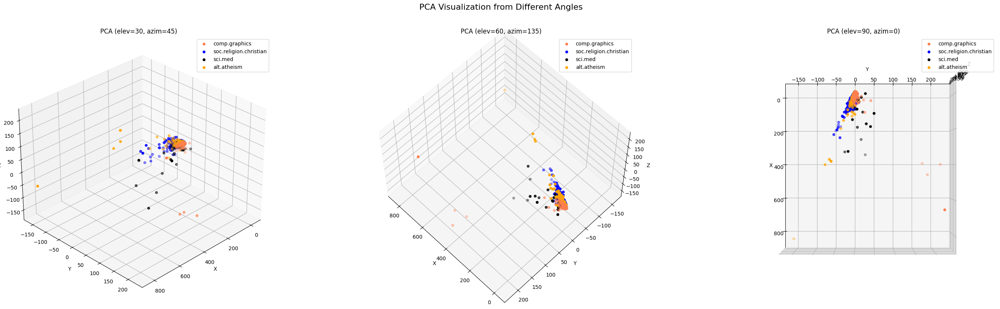

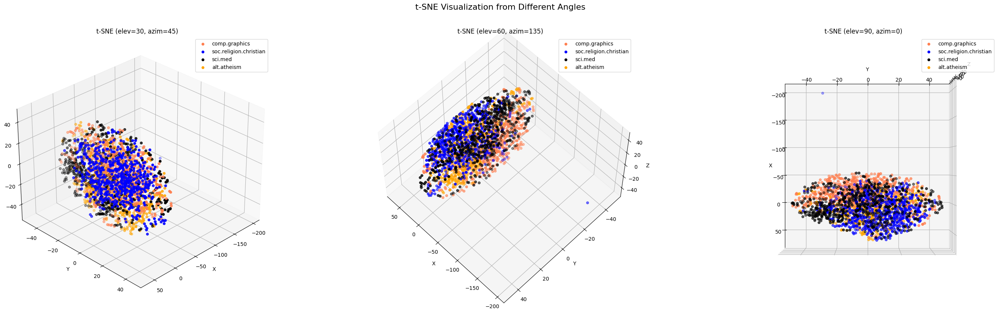

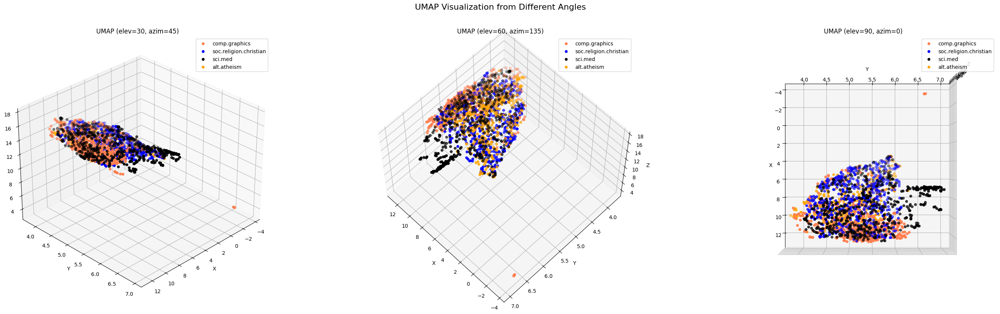

In [72]:
from mpl_toolkits.mplot3d import Axes3D
import matplotlib.pyplot as plt

# Define colors and categories
col = ['coral', 'blue', 'black', 'orange']
categories = X['category_name'].unique()

# Define viewing angles for subplots
views = [(30, 45), (60, 135), (90, 0)]  # (elevation, azimuth)

# Define a function to create a scatter plot
def plot_scatter_3d(pos, data, title, view_angle):
    ax = fig.add_subplot(1, 3, pos, projection='3d')
    
    for c, category in zip(col, categories):
        mask = X['category_name'] == category
        xs = data[mask, 0]
        ys = data[mask, 1]
        zs = data[mask, 2]
        ax.scatter(xs, ys, zs, c=c, marker='o', label=category)
    
    ax.grid(color='gray', linestyle=':', linewidth=0.5, alpha=0.2)
    ax.set_title(f'{title} (elev={view_angle[0]}, azim={view_angle[1]})')
    ax.set_xlabel('X')
    ax.set_ylabel('Y')
    ax.set_zlabel('Z')
    ax.legend(loc='upper right')
    
    # Set viewing angle
    ax.view_init(elev=view_angle[0], azim=view_angle[1])

# Define data methods and their titles
data_methods = [
    (X_pca_aug_3, 'PCA'),
    (X_tsne_aug_3, 't-SNE'),
    (X_umap_aug_3, 'UMAP')
]

# Create separate figure for each method
for data, method_title in data_methods:
    # Create new figure for each method
    fig = plt.figure(figsize=(30, 8))
    fig.suptitle(f'{method_title} Visualization from Different Angles', fontsize=16, y=1.02)
    
    # Plot the same data from three different angles
    for i, view in enumerate(views, 1):
        plot_scatter_3d(i, data, method_title, view)
    
    plt.tight_layout()
    plt.show()

<hr>

### **>>> Exercise 14 (Lab1 / take home - Exercise 19):** 

Try to generate the binarization using the `category_name` column instead. Does it work?

In [73]:
from sklearn import preprocessing, metrics, decomposition, pipeline, dummy
mlb = preprocessing.LabelBinarizer()
mlb.fit(X.category)
X['bin_category'] = mlb.transform(X.category).tolist()
X[0:9]

,text,category,category_name,tokenized_text,bin_category
0,From: sd345@city.ac.uk (Michael Collier) Subje...,1,comp.graphics,"{x3769, format., of, From:, Collier, anyone, T...","[0, 1, 0, 0]"
1,From: ani@ms.uky.edu (Aniruddha B. Deglurkar) ...,1,comp.graphics,"{of, Bezier, From:, body, loop, My, Sciences, ...","[0, 1, 0, 0]"
2,From: djohnson@cs.ucsd.edu (Darin Johnson) Sub...,3,soc.religion.christian,"{attention, From:, returned, supportive,, year...","[0, 0, 0, 1]"
3,From: s0612596@let.rug.nl (M.M. Zwart) Subject...,3,soc.religion.christian,"{Thanx,, in, ""M.M.Zwart""<s0612596@let.rug.nl>,...","[0, 0, 0, 1]"
4,From: stanly@grok11.columbiasc.ncr.com (stanly...,3,soc.religion.christian,"{of, ""clothes, our, From:, clothes, In, stanly...","[0, 0, 0, 1]"
5,From: vbv@lor.eeap.cwru.edu (Virgilio (Dean) B...,3,soc.religion.christian,"{(Virgilio, Univ., ""Not, (Steve, of, generally...","[0, 0, 0, 1]"
6,From: jodfishe@silver.ucs.indiana.edu (joseph ...,3,soc.religion.christian,"{judge., comes, re-think, of, Ephesians, are,,...","[0, 0, 0, 1]"
7,From: aldridge@netcom.com (Jacquelin Aldridge)...,2,sci.med,"{However,, From:, diet., oil, serious., Sort, ...","[0, 0, 1, 0]"
8,From: geb@cs.pitt.edu (Gordon Banks) Subject: ...,2,sci.med,"{Univ., most, Yes,, of, geb@cs.pitt.edu, Expla...","[0, 0, 1, 0]"


In [74]:
# generate the binarization using the `category_name` instead
mlb_ = preprocessing.LabelBinarizer()
mlb_.fit(X.category_name)
X['bin_category_name'] = mlb_.transform(X.category_name).tolist()
X[0:9]


# Now we can see that the `bin_category_name` column contains the binarized values for the `category_name` column

,text,category,category_name,tokenized_text,bin_category,bin_category_name
0,From: sd345@city.ac.uk (Michael Collier) Subje...,1,comp.graphics,"{x3769, format., of, From:, Collier, anyone, T...","[0, 1, 0, 0]","[0, 1, 0, 0]"
1,From: ani@ms.uky.edu (Aniruddha B. Deglurkar) ...,1,comp.graphics,"{of, Bezier, From:, body, loop, My, Sciences, ...","[0, 1, 0, 0]","[0, 1, 0, 0]"
2,From: djohnson@cs.ucsd.edu (Darin Johnson) Sub...,3,soc.religion.christian,"{attention, From:, returned, supportive,, year...","[0, 0, 0, 1]","[0, 0, 0, 1]"
3,From: s0612596@let.rug.nl (M.M. Zwart) Subject...,3,soc.religion.christian,"{Thanx,, in, ""M.M.Zwart""<s0612596@let.rug.nl>,...","[0, 0, 0, 1]","[0, 0, 0, 1]"
4,From: stanly@grok11.columbiasc.ncr.com (stanly...,3,soc.religion.christian,"{of, ""clothes, our, From:, clothes, In, stanly...","[0, 0, 0, 1]","[0, 0, 0, 1]"
5,From: vbv@lor.eeap.cwru.edu (Virgilio (Dean) B...,3,soc.religion.christian,"{(Virgilio, Univ., ""Not, (Steve, of, generally...","[0, 0, 0, 1]","[0, 0, 0, 1]"
6,From: jodfishe@silver.ucs.indiana.edu (joseph ...,3,soc.religion.christian,"{judge., comes, re-think, of, Ephesians, are,,...","[0, 0, 0, 1]","[0, 0, 0, 1]"
7,From: aldridge@netcom.com (Jacquelin Aldridge)...,2,sci.med,"{However,, From:, diet., oil, serious., Sort, ...","[0, 0, 1, 0]","[0, 0, 1, 0]"
8,From: geb@cs.pitt.edu (Gordon Banks) Subject: ...,2,sci.med,"{Univ., most, Yes,, of, geb@cs.pitt.edu, Expla...","[0, 0, 1, 0]","[0, 0, 1, 0]"


<hr>
<hr>

# **2. Second:**
follow the same process from the [DM2024-Lab1-Master](https://github.com/didiersalazar/DM2024-Lab1-Master.git) on **the new dataset**. You don't need to explain all details as we did (some **minimal comments** explaining your code are useful though).  __This part is worth 30% of your grade.__

- Download the [the new dataset](https://huggingface.co/datasets/Senem/Nostalgic_Sentiment_Analysis_of_YouTube_Comments_Data). The dataset contains a `sentiment` and `comment` columns, with the sentiment labels being: 'nostalgia' and 'not nostalgia'. Read the specificiations of the dataset for background details. 
- You are allowed to use and modify the `helper` functions in the folder of the first lab session (notice they may need modification) or create your own.

In [75]:
import pandas as pd
import helpers.data_mining_helpers as dmh

# Load the dataset from the CSV file
X_new = pd.read_csv("hf://datasets/Senem/Nostalgic_Sentiment_Analysis_of_YouTube_Comments_Data/Nostalgic_Sentiment_Analysis_of_YouTube_Comments_Data.csv")

In [76]:
# Take a look at the dataframe of the new dataset
X_new

,sentiment,comment
0,not nostalgia,He was a singer with a golden voice that I lov...
1,nostalgia,The mist beautiful voice ever I listened to hi...
2,nostalgia,I have most of Mr. Reeves songs. Always love ...
3,not nostalgia,30 day leave from 1st tour in Viet Nam to conv...
4,nostalgia,listening to his songs reminds me of my mum wh...
...,...,...
1495,not nostalgia,"i don't know!..but the opening of the video,....."
1496,not nostalgia,it's sad this is such a beautiful song when yo...
1497,not nostalgia,"Dear Friend, I think age and time is not that ..."
1498,nostalgia,I was born in 1954 and started to be aware of ...


In [77]:
# Check column names of new dataset
X_new.columns

Index(['sentiment', 'comment'], dtype='object')

In [78]:
# Check the unique values in the 'sentiment' column
X_new['sentiment'].unique()

array(['not nostalgia', 'nostalgia'], dtype=object)

In [79]:
# Construct a new column 'category' based on the 'sentiment' column
X_new['category'] = X_new['sentiment'].map({'not nostalgia': 0, 'nostalgia': 1})
X_new

,sentiment,comment,category
0,not nostalgia,He was a singer with a golden voice that I lov...,0
1,nostalgia,The mist beautiful voice ever I listened to hi...,1
2,nostalgia,I have most of Mr. Reeves songs. Always love ...,1
3,not nostalgia,30 day leave from 1st tour in Viet Nam to conv...,0
4,nostalgia,listening to his songs reminds me of my mum wh...,1
...,...,...,...
1495,not nostalgia,"i don't know!..but the opening of the video,.....",0
1496,not nostalgia,it's sad this is such a beautiful song when yo...,0
1497,not nostalgia,"Dear Friend, I think age and time is not that ...",0
1498,nostalgia,I was born in 1954 and started to be aware of ...,1


In [80]:
# print the first 3 content of the new dataset
X_new[:3]

,sentiment,comment,category
0,not nostalgia,He was a singer with a golden voice that I lov...,0
1,nostalgia,The mist beautiful voice ever I listened to hi...,1
2,nostalgia,I have most of Mr. Reeves songs. Always love ...,1


In [81]:
# Check the unique values now
X_new.columns

Index(['sentiment', 'comment', 'category'], dtype='object')

In [82]:
# Check the number of the new dataset
len(X_new['comment'])

1500

In [83]:
# Print an example of the comment from the new dataset
print(X_new['comment'][0])

He was a singer with a golden voice that I love to hear all the time. I was his great fan at the age of 16years in those days and still now. Although we have many singers now, but, I can vouch for Jim Reeves all the time. You feel relaxed, emotional and loving. Thank you Lord for his life.


In [84]:
# check the category and the sentiment of the first comment
print(X_new['category'][0])
print(X_new['sentiment'][0])

0
not nostalgia


### **>>> Exercise 1 (Watch Video):**  
In this exercise, please print out the *text* data for the first three samples in the dataset. (See the above code for help)

In [85]:
# Print out the comment data for the first three samples in the dataset
for i in range(3):
    print(f"Comment {i+1}: {X_new['comment'][i]}")
    print(f"Category: {X_new['category'][i]}")
    print(f"Sentiment: {X_new['sentiment'][i]}")
    print("\n")

Comment 1: He was a singer with a golden voice that I love to hear all the time. I was his great fan at the age of 16years in those days and still now. Although we have many singers now, but, I can vouch for Jim Reeves all the time. You feel relaxed, emotional and loving. Thank you Lord for his life.
Category: 0
Sentiment: not nostalgia


Comment 2: The mist beautiful voice ever I listened to him when I was a kid and still love his singing Never forgotten The voice of an angel
Category: 1
Sentiment: nostalgia


Comment 3: I have most of Mr. Reeves songs.  Always love his smooth voice, so comforting and sounds like the people I grew up around.  They were so gentle and sweet, but I had to leave my little town to find a job at age 17.  I graduated early.  I never forgot how great it was to grow up with simple people who had no pretensions -- just loving and gentle, like I think Jesus is.
Category: 1
Sentiment: nostalgia




Only query the `comment` and `category` columns of the first 10 samples

In [86]:
# only query the `comment` and `category` columns of the first 10 samples
X_new[:10][['comment', 'category']]

,comment,category
0,He was a singer with a golden voice that I lov...,0
1,The mist beautiful voice ever I listened to hi...,1
2,I have most of Mr. Reeves songs. Always love ...,1
3,30 day leave from 1st tour in Viet Nam to conv...,0
4,listening to his songs reminds me of my mum wh...,1
5,"Every time I heard this song as a child, I use...",1
6,"My dad loved listening to Jim Reeves, when I w...",1
7,i HAVE ALSO LISTENED TO Jim Reeves since child...,1
8,Wherever you are you always in my heart,0
9,Elvis will always be number one no one can com...,0


In [87]:
# Query the last 10 records
X_new[-10:]

,sentiment,comment,category
1490,not nostalgia,"He really isn't my cup of tea, but some of his...",0
1491,nostalgia,real music...how i miss those days...brings ba...,1
1492,nostalgia,i used to cry over this song cause i had a boy...,1
1493,not nostalgia,"He really has that ""love you like a brother"" l...",0
1494,not nostalgia,That's funny. But Leo really is a nice guy. He...,0
1495,not nostalgia,"i don't know!..but the opening of the video,.....",0
1496,not nostalgia,it's sad this is such a beautiful song when yo...,0
1497,not nostalgia,"Dear Friend, I think age and time is not that ...",0
1498,nostalgia,I was born in 1954 and started to be aware of ...,1
1499,nostalgia,This is the first CD I bought after my marriag...,1


In [88]:
# Query the `comment` of the first 10 records by `loc` (by label)
X_new.loc[:9, 'comment']

0    He was a singer with a golden voice that I lov...
1    The mist beautiful voice ever I listened to hi...
2    I have most of Mr. Reeves songs.  Always love ...
3    30 day leave from 1st tour in Viet Nam to conv...
4    listening to his songs reminds me of my mum wh...
5    Every time I heard this song as a child, I use...
6    My dad loved listening to Jim Reeves, when I w...
7    i HAVE ALSO LISTENED TO Jim Reeves since child...
8             Wherever you  are you always in my heart
9    Elvis will always be number one no one can com...
Name: comment, dtype: object

In [89]:
# Query the `comment` of the first 10 records by `iloc` (by position)
X_new.iloc[:10, 1]

0    He was a singer with a golden voice that I lov...
1    The mist beautiful voice ever I listened to hi...
2    I have most of Mr. Reeves songs.  Always love ...
3    30 day leave from 1st tour in Viet Nam to conv...
4    listening to his songs reminds me of my mum wh...
5    Every time I heard this song as a child, I use...
6    My dad loved listening to Jim Reeves, when I w...
7    i HAVE ALSO LISTENED TO Jim Reeves since child...
8             Wherever you  are you always in my heart
9    Elvis will always be number one no one can com...
Name: comment, dtype: object

### **>>> Exercise 2 (take home):** 

Experiment with other querying techniques using pandas dataframes. Refer to their [documentation](https://pandas.pydata.org/pandas-docs/stable/indexing.html) for more information. 

In [90]:
# use loc to query the data that belongs to the category of 'nostalgia'
X_new.loc[lambda df: df['sentiment'] == 'nostalgia']

,sentiment,comment,category
1,nostalgia,The mist beautiful voice ever I listened to hi...,1
2,nostalgia,I have most of Mr. Reeves songs. Always love ...,1
4,nostalgia,listening to his songs reminds me of my mum wh...,1
5,nostalgia,"Every time I heard this song as a child, I use...",1
6,nostalgia,"My dad loved listening to Jim Reeves, when I w...",1
...,...,...,...
1488,nostalgia,Yup !!!! Bringing back an Enormous amount of ...,1
1491,nostalgia,real music...how i miss those days...brings ba...,1
1492,nostalgia,i used to cry over this song cause i had a boy...,1
1498,nostalgia,I was born in 1954 and started to be aware of ...,1


In [91]:
# Get the multiple indexers of specific columns
X_new.iloc[[1, 3, 10, 20, 33], X_new.columns.get_indexer(['comment', 'sentiment'])]

,comment,sentiment
1,The mist beautiful voice ever I listened to hi...,nostalgia
3,30 day leave from 1st tour in Viet Nam to conv...,not nostalgia
10,ill bet if they begin to play this song on the...,not nostalgia
20,So many happy memories of the Jim reeves album...,nostalgia
33,It's great to hear the different generations o...,not nostalgia


In [92]:
# use .sample to query 5 random records from the dataframe

X_new.sample(n = 5, random_state = 42)

,sentiment,comment,category
1116,not nostalgia,"Perception of death, birth, sorrow, suffering,...",0
1368,not nostalgia,One of those Classic (and there were so many o...,0
422,nostalgia,So many memories in each and every song,1
413,nostalgia,Was it in 1968 when Engelbert released it? I ...,1
451,nostalgia,OMG talk about take a trip down memory lane ho...,1


In [93]:
# use boolean indexing to query the data that belongs to the category 3
X_new[X_new['category'] == 0].sample(n = 5, random_state = 42)

,sentiment,comment,category
1019,not nostalgia,By far my favorite singer of all time. So pure...,0
683,not nostalgia,I'm waiting for the train at the platform and ...,0
249,not nostalgia,He had a style all his own. A range that was a...,0
497,not nostalgia,"Loved Ruby in the 50&60, love her still and I'...",0
573,not nostalgia,I can't believe there is one dislike for this ...,0


In [94]:
# use .map to produce more complex criteria
# query the data that text starts with 'From: da'
criterion = X_new['comment'].map(lambda x: 'song' in x)
X_new[criterion]

,sentiment,comment,category
2,nostalgia,I have most of Mr. Reeves songs. Always love ...,1
3,not nostalgia,30 day leave from 1st tour in Viet Nam to conv...,0
4,nostalgia,listening to his songs reminds me of my mum wh...,1
5,nostalgia,"Every time I heard this song as a child, I use...",1
10,not nostalgia,ill bet if they begin to play this song on the...,0
...,...,...,...
1492,nostalgia,i used to cry over this song cause i had a boy...,1
1493,not nostalgia,"He really has that ""love you like a brother"" l...",0
1496,not nostalgia,it's sad this is such a beautiful song when yo...,0
1497,not nostalgia,"Dear Friend, I think age and time is not that ...",0


In [95]:
# multiple criteria by using & and 'criterion' created above
# query the data that text starts with 'From: da' and belongs to the category 1

X_new[criterion & (X_new['category'] == 1)]

,sentiment,comment,category
2,nostalgia,I have most of Mr. Reeves songs. Always love ...,1
4,nostalgia,listening to his songs reminds me of my mum wh...,1
5,nostalgia,"Every time I heard this song as a child, I use...",1
11,nostalgia,this song came out my senior year in high scho...,1
13,nostalgia,I am 47 and grew up on songs of this type. I ...,1
...,...,...,...
1482,nostalgia,"Love the song, brings me back to a better plac...",1
1484,nostalgia,My dad always played this song for mom when i ...,1
1487,nostalgia,I really love this song. My dad always turns 6...,1
1492,nostalgia,i used to cry over this song cause i had a boy...,1


In [96]:
# use where() to query the data that category is 3
# show the first 5 records
X_new.where(X_new['category'] == 1).head()

# this is almostly equivalent to X_new[X_new['category'] == 1].head() but with NaN values
# NaN values represent the data that does not meet the criteria

,sentiment,comment,category
0,NaN,NaN,NaN
1,nostalgia,The mist beautiful voice ever I listened to hi...,1.0
2,nostalgia,I have most of Mr. Reeves songs. Always love ...,1.0
3,NaN,NaN,NaN
4,nostalgia,listening to his songs reminds me of my mum wh...,1.0


### **>>> Exercise 3 (Watch Video):**  
Try to fetch records belonging to the ```nostalgia``` category, and query every 10th record. Only show the first 5 records.

In [97]:
X_new[X_new['sentiment'] == 'nostalgia'].iloc[::10][:5]

,sentiment,comment,category
1,nostalgia,The mist beautiful voice ever I listened to hi...,1
18,nostalgia,"My Grandparents had a pub in the 1970's, this ...",1
32,nostalgia,I remember my Mom listening to Jim over and ov...,1
50,nostalgia,"If I remember correctly, this song came out af...",1
71,nostalgia,Gosh does this bring back memories. Nearly eve...,1


We are going to go with the first option but you may be asked to compute missing values, using a different approach, as an exercise. Let's get to it!

First we want to add the dummy records with missing values since the dataset we have is perfectly composed and cleaned that it contains no missing values. First let us check for ourselves that indeed the dataset doesn't contain any missing values. We can do that easily by using the following built-in function provided by Pandas.  

In [98]:
# Check missing values
X_new.isnull()

,sentiment,comment,category
0,False,False,False
1,False,False,False
2,False,False,False
3,False,False,False
4,False,False,False
...,...,...,...
1495,False,False,False
1496,False,False,False
1497,False,False,False
1498,False,False,False


In most cases, the build-in functions are good enough, but as you saw above when the entire table was printed, it is impossible to tell if there are missing records just by looking at preview of records manually, especially in cases where the dataset is huge. We want a more reliable way to achieve this. Let's get to it!

In [99]:
X_new.isnull().apply(lambda x: dmh.check_missing_values(x))
# Equivalent to # X.isnull().apply(lambda x: dmh.check_missing_values(x), axis = 0)

,sentiment,comment,category
0,The amoung of missing records is:,The amoung of missing records is:,The amoung of missing records is:
1,0,0,0


### >>> **Exercise 4 (Watch Video):** 
Let's try something different. Instead of calculating missing values by column let's try to calculate the missing values in every record instead of every column.  
$Hint$ : `axis` parameter. Check the documentation for more information.

In [100]:
X_new.isnull().apply(lambda x: dmh.check_missing_values(x), axis = 1)

0       (The amoung of missing records is: , 0)
1       (The amoung of missing records is: , 0)
2       (The amoung of missing records is: , 0)
3       (The amoung of missing records is: , 0)
4       (The amoung of missing records is: , 0)
                         ...                   
1495    (The amoung of missing records is: , 0)
1496    (The amoung of missing records is: , 0)
1497    (The amoung of missing records is: , 0)
1498    (The amoung of missing records is: , 0)
1499    (The amoung of missing records is: , 0)
Length: 1500, dtype: object

We will insert a `Series`, which is basically a "one-dimensional labeled array capable of holding data of any type (integer, string, float, python objects, etc.). The axis labels are collectively called index.", into our current dataframe.

In [101]:
dummy_series_new = pd.Series(["dummy_record", 1], index=["comment", "category"])
dummy_series_new

comment     dummy_record
category               1
dtype: object

In [102]:
dummy_series_new.to_frame().T

,comment,category
0,dummy_record,1


In [103]:
result_with_series_new = pd.concat([X_new, dummy_series_new.to_frame().T], ignore_index=True)
result_with_series_new

,sentiment,comment,category
0,not nostalgia,He was a singer with a golden voice that I lov...,0
1,nostalgia,The mist beautiful voice ever I listened to hi...,1
2,nostalgia,I have most of Mr. Reeves songs. Always love ...,1
3,not nostalgia,30 day leave from 1st tour in Viet Nam to conv...,0
4,nostalgia,listening to his songs reminds me of my mum wh...,1
...,...,...,...
1496,not nostalgia,it's sad this is such a beautiful song when yo...,0
1497,not nostalgia,"Dear Friend, I think age and time is not that ...",0
1498,nostalgia,I was born in 1954 and started to be aware of ...,1
1499,nostalgia,This is the first CD I bought after my marriag...,1


In [104]:
# check if the records was commited into result
len(result_with_series_new)

1501

Now we that we have added the record with some missing values. Let try our function and see if it can detect that there is a missing value on the resulting dataframe.

In [105]:
result_with_series_new.isnull().apply(lambda x: dmh.check_missing_values(x))

,sentiment,comment,category
0,The amoung of missing records is:,The amoung of missing records is:,The amoung of missing records is:
1,1,0,0


In [106]:
# dummy record as dictionary format
dummy_dict_new = [{'comment': 'dummy_record',
                   'category': 1
                   }]

In [107]:
# Concatenate the new record to the DataFrame
X_new = pd.concat([X_new, pd.DataFrame(dummy_dict_new)], ignore_index=True)
X_new

,sentiment,comment,category
0,not nostalgia,He was a singer with a golden voice that I lov...,0
1,nostalgia,The mist beautiful voice ever I listened to hi...,1
2,nostalgia,I have most of Mr. Reeves songs. Always love ...,1
3,not nostalgia,30 day leave from 1st tour in Viet Nam to conv...,0
4,nostalgia,listening to his songs reminds me of my mum wh...,1
...,...,...,...
1496,not nostalgia,it's sad this is such a beautiful song when yo...,0
1497,not nostalgia,"Dear Friend, I think age and time is not that ...",0
1498,nostalgia,I was born in 1954 and started to be aware of ...,1
1499,nostalgia,This is the first CD I bought after my marriag...,1


In [108]:
# Check missing values
X_new.isnull().apply(lambda x: dmh.check_missing_values(x))

,sentiment,comment,category
0,The amoung of missing records is:,The amoung of missing records is:,The amoung of missing records is:
1,1,0,0


In [109]:
# Drop the record with missing values
X_new.dropna(inplace=True)

In [110]:
# Check missing values
X_new.isnull().apply(lambda x: dmh.check_missing_values(x))
# Now we can see that there are no missing values in the dataset

,sentiment,comment,category
0,The amoung of missing records is:,The amoung of missing records is:,The amoung of missing records is:
1,0,0,0


<hr>

### **>>> Exercise 2 (Lab1 / take home - Exercise 5):** 

There is an old saying that goes, "The devil is in the details." When we are working with extremely large data, it's difficult to check records one by one (as we have been doing so far). And also, we don't even know what kind of missing values we are facing. Thus, "debugging" skills get sharper as we spend more time solving bugs. Let's focus on a different method to check for missing values and the kinds of missing values you may encounter. It's not easy to check for missing values as you will find out in a minute.

Please check the data and the process below, describe what you observe and why it happened.   
$Hint$ :  why `.isnull()` didn't work?

In [111]:
import numpy as np

NA_dict = [{ 'id': 'A', 'missing_example': np.nan },
           { 'id': 'B'                            },
           { 'id': 'C', 'missing_example': 'NaN'  },
           { 'id': 'D', 'missing_example': 'None' },
           { 'id': 'E', 'missing_example':  None  },
           { 'id': 'F', 'missing_example': ''     }]

NA_df = pd.DataFrame(NA_dict, columns = ['id','missing_example'])
NA_df['isnull'] = NA_df['missing_example'].isnull()
NA_df

,id,missing_example,isnull
0,A,NaN,True
1,B,NaN,True
2,C,NaN,False
3,D,None,False
4,E,None,True
5,F,,False


The values for *missing_example* vary and include:

- ```np.nan``` : Not A Number, represent missing value in NumPy and pandas
- ```　``` : implicitly created due to no value provided
- ```'NaN'``` : just a string with content 'NaN'
- ```'None'``` : just a string with content 'None'
- ```None``` : represent missing value
- ```''``` : just an empty string.

When running ```NA_df['missing_example'].isnull()```, the method does not treat all of the missing values the same way, because ```isnull()``` specifically checks for recognized "missing" types, like ```np.nan``` and ```None```.

### 4.2 Dealing with Duplicate Data

check how many duplicates we have in our current dataset. Here is the line of code that checks for duplicates by `isnull` function. 

In [112]:
X_new.duplicated()

0       False
1       False
2       False
3       False
4       False
        ...  
1495    False
1496    False
1497    False
1498    False
1499    False
Length: 1500, dtype: bool

We can also check the sum of duplicate records by simply doing:

In [113]:
sum(X_new.duplicated()) 
# There is 1 duplicated record

1

In [114]:
sum(X_new.duplicated('comment'))

1

In [115]:
# Print the duplicated record and the record it duplicates
X_new[X_new.duplicated()]

,sentiment,comment,category
78,not nostalgia,never heard this song before... WOW What an am...,0


We want to get rid of all the duplicated records without preserving a copy. We can simply do that with the following line of code:

In [116]:
# Drop the duplicated record and keep the first record
X_new.drop_duplicates(keep = 'first', inplace = True) 
X_new

,sentiment,comment,category
0,not nostalgia,He was a singer with a golden voice that I lov...,0
1,nostalgia,The mist beautiful voice ever I listened to hi...,1
2,nostalgia,I have most of Mr. Reeves songs. Always love ...,1
3,not nostalgia,30 day leave from 1st tour in Viet Nam to conv...,0
4,nostalgia,listening to his songs reminds me of my mum wh...,1
...,...,...,...
1495,not nostalgia,"i don't know!..but the opening of the video,.....",0
1496,not nostalgia,it's sad this is such a beautiful song when yo...,0
1497,not nostalgia,"Dear Friend, I think age and time is not that ...",0
1498,nostalgia,I was born in 1954 and started to be aware of ...,1


In [117]:
# Check the length of the dataset after dropping duplicates
len(X_new)

1499

## 5.  Data Preprocessing
### 5.1 Sampling

In [118]:
X_new_sample = X_new.sample(n=500)

In [119]:
len(X_new_sample)

500

In [120]:
X_new_sample[:4]

,sentiment,comment,category
1265,not nostalgia,"ALL these years, I had no idea this was sung b...",0
835,not nostalgia,"Lyrics don't seem the same in songs today, thi...",0
1305,nostalgia,Legendary. So wish I didn't have to grow up. S...,1
1264,not nostalgia,"i love this song ,lovely .its all about love.i...",0


### **>>> Exercise 6 (take home):**
Notice any changes from the `X_new` dataframe to the `X_new_sample` dataframe? What are they? Report every change you noticed as compared to the previous state of `X_new`. Feel free to query and look more closely at the dataframe for these changes.

In [121]:
# From the difference of X_new_sample and X_new, we can see that the order of the data is shuffled
# Another finding is that the index of the data is not continuous, which means the data is sampled from the original data

# use .reset_index to reset the index of the data
X_new_sample.reset_index(drop = False)[:5]

,index,sentiment,comment,category
0,1265,not nostalgia,"ALL these years, I had no idea this was sung b...",0
1,835,not nostalgia,"Lyrics don't seem the same in songs today, thi...",0
2,1305,nostalgia,Legendary. So wish I didn't have to grow up. S...,1
3,1264,not nostalgia,"i love this song ,lovely .its all about love.i...",0
4,837,not nostalgia,I don't know how you do what you did to create...,0


In [122]:
# drop=True means the old index will be dropped and not added as a new column

X_new_sample.reset_index(drop=True)[:5]

,sentiment,comment,category
0,not nostalgia,"ALL these years, I had no idea this was sung b...",0
1,not nostalgia,"Lyrics don't seem the same in songs today, thi...",0
2,nostalgia,Legendary. So wish I didn't have to grow up. S...,1
3,not nostalgia,"i love this song ,lovely .its all about love.i...",0
4,not nostalgia,I don't know how you do what you did to create...,0


Let's do something cool here while we are working with sampling! Let us look at the distribution of categories in both the sample and original dataset. Let us visualize and analyze the disparity between the two datasets. To generate some visualizations, we are going to use `matplotlib` python library. With matplotlib, things are faster and compatability-wise it may just be the best visualization library for visualizing content extracted from dataframes and when using Jupyter notebooks. Let's take a loot at the magic of `matplotlib` below.

In [123]:
import matplotlib.pyplot as plt
%matplotlib inline

sentiment
nostalgia        750
not nostalgia    749
Name: count, dtype: int64


<Axes: title={'center': 'Category distribution'}, xlabel='sentiment'>

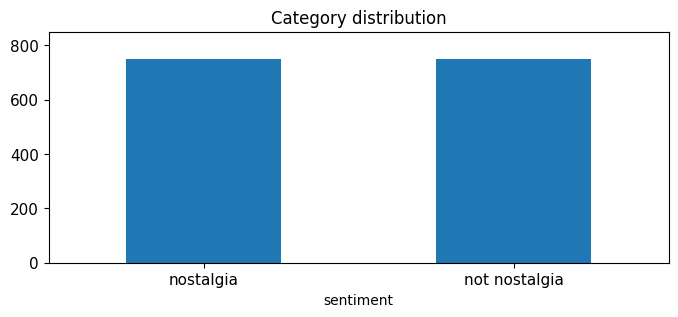

In [124]:
print(X_new['sentiment'].value_counts())

# plot barchart for X
X_new['sentiment'].value_counts().plot(kind = 'bar',
                                        title = 'Category distribution',
                                        ylim = [0, 850],        
                                        rot = 0, fontsize = 11, figsize = (8,3))

sentiment
not nostalgia    268
nostalgia        232
Name: count, dtype: int64


<Axes: title={'center': 'Category distribution'}, xlabel='sentiment'>

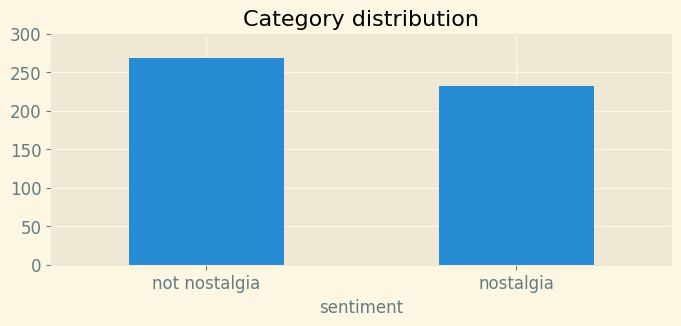

In [125]:
print(X_new_sample['sentiment'].value_counts())

# plot barchart for X_new_sample
plt.style.use('Solarize_Light2')
X_new_sample['sentiment'].value_counts().plot(kind = 'bar',
                                               title = 'Category distribution',
                                               ylim = [0, 300], 
                                               rot = 0, fontsize = 12, figsize = (8,3))

### >>> **Exercise 7 (Watch Video):**
Notice that for the `ylim` parameters we hardcoded the maximum value for y. Is it possible to automate this instead of hard-coding it? How would you go about doing that? (Hint: look at code above for clues)

sentiment
not nostalgia    268
nostalgia        232
Name: count, dtype: int64


<Axes: title={'center': 'Category distribution'}, xlabel='sentiment'>

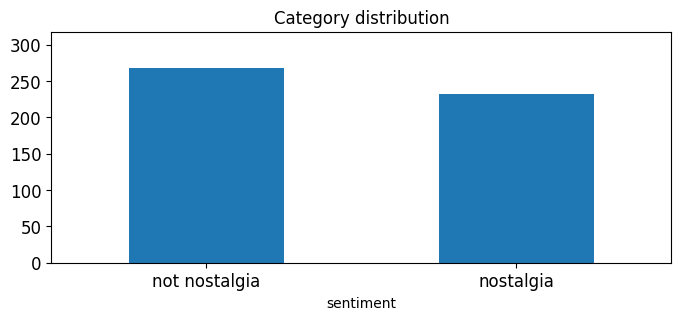

In [126]:
upper_bound_new = max(X_new_sample['sentiment'].value_counts()) + 50
print(X_new_sample['sentiment'].value_counts())
plt.style.use('default')
X_new_sample['sentiment'].value_counts().plot(kind = 'bar',
                                               title = 'Category distribution',
                                               ylim = [0, upper_bound_new], 
                                               rot = 0, fontsize = 12, figsize = (8,3))

### >>> **Exercise 8 (take home):** 
We can also do a side-by-side comparison of the distribution between the two datasets, but maybe you can try that as an excerise. Below we show you an snapshot of the type of chart we are looking for.

sentiment
not nostalgia    268
nostalgia        232
Name: count, dtype: int64


Text(0.5, 1.0, 'Category distribution')

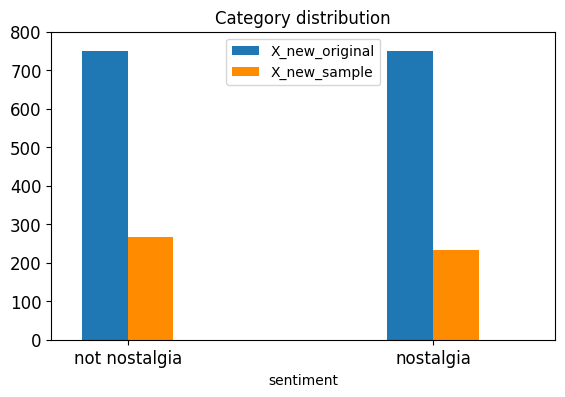

In [127]:
import matplotlib.pyplot as plt

upper_bound_new = max(X_new['sentiment'].value_counts()) + 50
print(X_new_sample['sentiment'].value_counts())
plt.style.use('default')

ax = X_new['sentiment'].value_counts().plot(kind = 'bar',
                                            width = 0.15,
                                            position = 1,
                                            rot = 0,
                                            ylim = [0, upper_bound_new],
                                            fontsize = 12,
                                            label = 'X_new_original',
                                            figsize = (6.5,4))
X_new_sample['sentiment'].value_counts().plot(kind = 'bar',
                                              width = 0.15,
                                              position = 0,
                                              rot = 0,
                                              color = 'darkorange',
                                              fontsize = 12,
                                              label = 'X_new_sample',
                                              ax = ax)
plt.legend(loc = 'upper center')
plt.title('Category distribution')

### 5.2 Feature Creation

In [128]:
import nltk
nltk.data.path = []
nltk.download('punkt', download_dir='C:/Users/USER/Desktop/作業和報告/研究所/資料探勘與應用/DM2024-Lab1-Homework/nltk_data')
nltk.download('punkt_tab', download_dir='C:/Users/USER/Desktop/作業和報告/研究所/資料探勘與應用/DM2024-Lab1-Homework/nltk_data')
nltk.data.path.append('C:/Users/USER/Desktop/作業和報告/研究所/資料探勘與應用/DM2024-Lab1-Homework/nltk_data')

[nltk_data] Downloading package punkt to C:/Users/USER/Desktop/作業和報告/研
[nltk_data]     究所/資料探勘與應用/DM2024-Lab1-Homework/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package punkt_tab to C:/Users/USER/Desktop/作業和
[nltk_data]     報告/研究所/資料探勘與應用/DM2024-Lab1-Homework/nltk_data...
[nltk_data]   Package punkt_tab is already up-to-date!


In [129]:
X_new['unigrams'] = X_new['comment'].apply(lambda x: dmh.tokenize_text(x))

In [130]:
X_new[0:4]["unigrams"]

0    [He, was, a, singer, with, a, golden, voice, t...
1    [The, mist, beautiful, voice, ever, I, listene...
2    [I, have, most, of, Mr., Reeves, songs, ., Alw...
3    [30, day, leave, from, 1st, tour, in, Viet, Na...
Name: unigrams, dtype: object

In [131]:
X_new[0:4]

,sentiment,comment,category,unigrams
0,not nostalgia,He was a singer with a golden voice that I lov...,0,"[He, was, a, singer, with, a, golden, voice, t..."
1,nostalgia,The mist beautiful voice ever I listened to hi...,1,"[The, mist, beautiful, voice, ever, I, listene..."
2,nostalgia,I have most of Mr. Reeves songs. Always love ...,1,"[I, have, most, of, Mr., Reeves, songs, ., Alw..."
3,not nostalgia,30 day leave from 1st tour in Viet Nam to conv...,0,"[30, day, leave, from, 1st, tour, in, Viet, Na..."


In [132]:
list(X_new[0:1]['unigrams'])

[['He',
  'was',
  'a',
  'singer',
  'with',
  'a',
  'golden',
  'voice',
  'that',
  'I',
  'love',
  'to',
  'hear',
  'all',
  'the',
  'time',
  '.',
  'I',
  'was',
  'his',
  'great',
  'fan',
  'at',
  'the',
  'age',
  'of',
  '16years',
  'in',
  'those',
  'days',
  'and',
  'still',
  'now',
  '.',
  'Although',
  'we',
  'have',
  'many',
  'singers',
  'now',
  ',',
  'but',
  ',',
  'I',
  'can',
  'vouch',
  'for',
  'Jim',
  'Reeves',
  'all',
  'the',
  'time',
  '.',
  'You',
  'feel',
  'relaxed',
  ',',
  'emotional',
  'and',
  'loving',
  '.',
  'Thank',
  'you',
  'Lord',
  'for',
  'his',
  'life',
  '.']]

### 5.3 Feature subset selection
We are going to generate a document-term matrix from the original dataset. Let us use scikit learn built in functionalities to generate this document.

In [133]:
from sklearn.feature_extraction.text import CountVectorizer

count_vect_new = CountVectorizer()
X_new_counts = count_vect_new.fit_transform(X_new.comment)
print(X_new_counts[0]) # (0, 1598) 1 # represent the first document contains the word that has index 1598

  (np.int32(0), np.int32(1598))	1
  (np.int32(0), np.int32(3570))	2
  (np.int32(0), np.int32(2973))	1
  (np.int32(0), np.int32(3650))	1
  (np.int32(0), np.int32(1470))	1
  (np.int32(0), np.int32(3534))	1
  (np.int32(0), np.int32(3282))	1
  (np.int32(0), np.int32(2028))	1
  (np.int32(0), np.int32(3336))	1
  (np.int32(0), np.int32(1606))	1
  (np.int32(0), np.int32(233))	2
  (np.int32(0), np.int32(3284))	3
  (np.int32(0), np.int32(3328))	2
  (np.int32(0), np.int32(1651))	2
  (np.int32(0), np.int32(1512))	1
  (np.int32(0), np.int32(1249))	1
  (np.int32(0), np.int32(323))	1
  (np.int32(0), np.int32(214))	1
  (np.int32(0), np.int32(2341))	1
  (np.int32(0), np.int32(15))	1
  (np.int32(0), np.int32(1733))	1
  (np.int32(0), np.int32(3304))	1
  (np.int32(0), np.int32(907))	1
  (np.int32(0), np.int32(258))	2
  (np.int32(0), np.int32(3124))	1
  (np.int32(0), np.int32(2328))	2
  (np.int32(0), np.int32(245))	1
  (np.int32(0), np.int32(3581))	1
  (np.int32(0), np.int32(1591))	1
  (np.int32(0), np.int

See some examples of what each feature is based on their index in the vector:

In [134]:
# represent the number of unique words in the dataset
len(count_vect_new.get_feature_names_out())

3730

In [135]:
# get the word that represents the index 2490 in the vocabulary that we have learned
count_vect_new.get_feature_names_out()[2490] 

'place'

Create our own analyzers or even use the nltk analyzer that we previously built. To keep things tidy and minimal we are going to use the default analyzer provided by `CountVectorizer`. Let us look closely at this analyzer. 

In [136]:
analyze_new = count_vect_new.build_analyzer()
analyze_new("I am craving for a hawaiian pizza right now")

['am', 'craving', 'for', 'hawaiian', 'pizza', 'right', 'now']

### **>>> Exercise 9 (Watch Video):**
Let's analyze the first record of our X_new dataframe with the new analyzer we have just built.

In [137]:
analyze_new(X_new.comment[0])

['he',
 'was',
 'singer',
 'with',
 'golden',
 'voice',
 'that',
 'love',
 'to',
 'hear',
 'all',
 'the',
 'time',
 'was',
 'his',
 'great',
 'fan',
 'at',
 'the',
 'age',
 'of',
 '16years',
 'in',
 'those',
 'days',
 'and',
 'still',
 'now',
 'although',
 'we',
 'have',
 'many',
 'singers',
 'now',
 'but',
 'can',
 'vouch',
 'for',
 'jim',
 'reeves',
 'all',
 'the',
 'time',
 'you',
 'feel',
 'relaxed',
 'emotional',
 'and',
 'loving',
 'thank',
 'you',
 'lord',
 'for',
 'his',
 'life']

Now let us look at the term-document matrix we built above.

In [138]:
# We can check the shape of this matrix by:

X_new_counts.shape 
# represent there are 1499 comments and 3730 unique words in the dataset

(1499, 3730)

In [139]:
# We can obtain the feature names of the vectorizer, i.e., the terms
# usually on the horizontal axis

# Get the first 10 unique words in the vocabulary that we have learned
count_vect_new.get_feature_names_out()[0:10]

array(['00', '000', '045', '07', '10', '100', '10m', '11', '11th', '12'],
      dtype=object)

In [140]:
# Convert from sparse array to normal array
# Get the first 5 comments and the first 100 records of number of occurences of each word
X_new_counts[0:5, 0:100].toarray() 

array([[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0,

In [141]:
# To see what the word is 

print(count_vect_new.get_feature_names_out()[15])
print(count_vect_new.get_feature_names_out()[16])
print(count_vect_new.get_feature_names_out()[62])

16years
17
1st


The result is just this huge sparse matrix, which is computationally intensive to generate and difficult to visualize. But we can see that the fourth record, specifically, contains a `1` in the index 62, which from our feature names we can deduce that this article contains exactly one `1st` term.

### **>>> Exercise 10 (take home):**
We said that the `1` at the index 62 of the fourth record represents the `1st` term. Notice that there is another 1 in the same record. Provide code that can verify what word this 1 represents from the vocabulary. Try to do this as efficient as possible.

In [142]:
# Get those words that number of occurences is 1 of the first 5 comments
for i in range(5):
    print(count_vect_new.inverse_transform(X_new_counts[i, 0:100].toarray())[0].tolist())

['16years']
[]
['17']
['1st', '2nd', '30']
[]


Let us look at this nice little heat map of our term-document matrix. It may come as a surpise to see the gems we can mine when you start to look at the data from a different perspective. Visualization are good for this reason.

In [143]:
# first twenty unique words in the vocabulary that we have learned
plot_x_new = ["term_"+str(i) for i in count_vect_new.get_feature_names_out()[0:20]]
print(plot_x_new)

['term_00', 'term_000', 'term_045', 'term_07', 'term_10', 'term_100', 'term_10m', 'term_11', 'term_11th', 'term_12', 'term_13', 'term_14', 'term_15', 'term_150', 'term_16', 'term_16years', 'term_17', 'term_17th', 'term_18', 'term_19']


In [144]:
# obtain the index of the first 20 comment
plot_y_new = ["doc_"+ str(i) for i in list(X_new.index)[0:20]]
print(plot_y_new)

['doc_0', 'doc_1', 'doc_2', 'doc_3', 'doc_4', 'doc_5', 'doc_6', 'doc_7', 'doc_8', 'doc_9', 'doc_10', 'doc_11', 'doc_12', 'doc_13', 'doc_14', 'doc_15', 'doc_16', 'doc_17', 'doc_18', 'doc_19']


In [145]:
# Get the number of occurences of those uniques words in the first 20 uniques words of the first 20 comments
# [how many comments, how many unique words]
plot_z_new = X_new_counts[0:20, 0:20].toarray()
print(plot_z_new)

[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]]


Use another visualization library called `seaborn`.

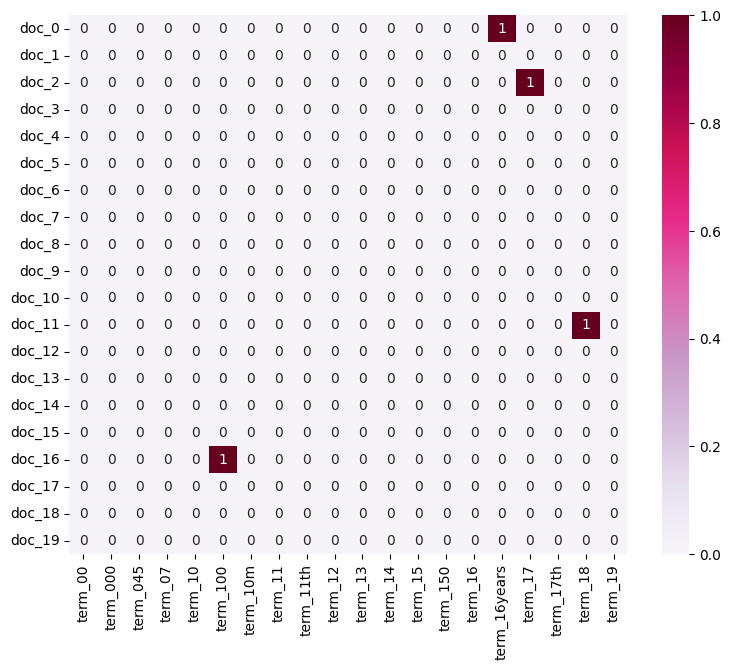

In [146]:
import seaborn as sns

df_todraw_new = pd.DataFrame(plot_z_new, columns = plot_x_new, index = plot_y_new)
plt.subplots(figsize=(9, 7))
ax = sns.heatmap(df_todraw_new,
                 cmap="PuRd",
                 vmin=0, vmax=1, annot=True)

# The graph is too sparse

### **>>> Exercise 11 (take home):** 
From the chart above, we can see how sparse the term-document matrix is; i.e., there is only one terms with **FREQUENCY** of `1` in the subselection of the matrix. By the way, you may have noticed that we only selected 20 articles and 20 terms to plot the histrogram. As an excersise you can try to modify the code above to plot the entire term-document matrix or just a sample of it. How would you do this efficiently? Remember there is a lot of words in the vocab. Report below what methods you would use to get a nice and useful visualization.

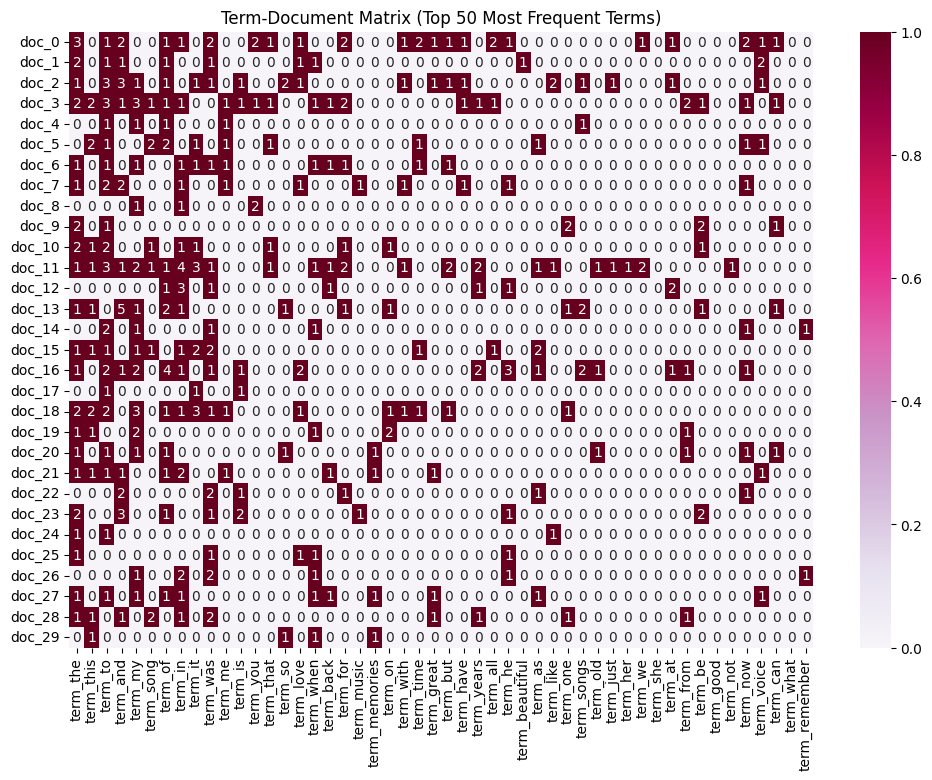

In [148]:
# Calculate the sum of occurences of each word in all comments
term_frequencies_new = X_new_counts.sum(axis=0).A1

# Get the first 50 words that have the highest occurences
top_terms_idx_new = term_frequencies_new.argsort()[-50:][::-1]

# Visualize by those high occurences words
plot_x_new_2 = ["term_"+str(i) for i in count_vect_new.get_feature_names_out()[top_terms_idx_new]]
plot_y_new_2 = ["doc_"+ str(i) for i in list(X_new.index)[0:30]]
plot_z_new_2 = X_new_counts[0:30, top_terms_idx_new].toarray()

df_todraw_new_2 = pd.DataFrame(plot_z_new_2, columns = plot_x_new_2, index = plot_y_new_2)
plt.figure(figsize=(12, 8))
ax_2 = sns.heatmap(df_todraw_new_2, cmap="PuRd", vmin=0, vmax=1, annot=True)
plt.title("Term-Document Matrix (Top 50 Most Frequent Terms)")
plt.xticks(rotation = 90)
plt.show()

# Choose the top 50 words that have the highest occurences

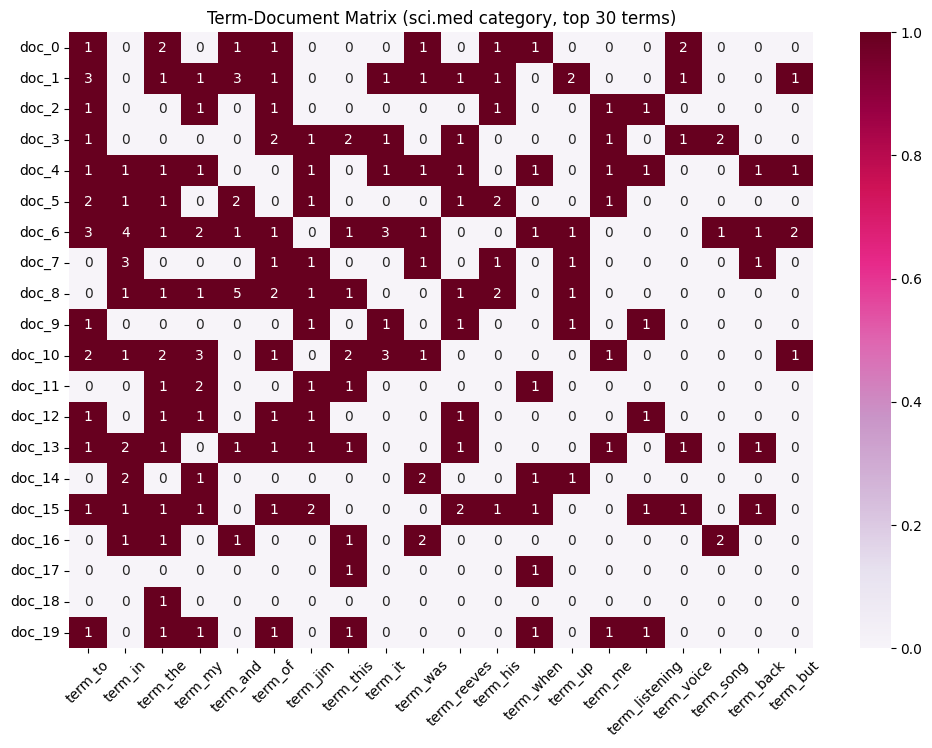

In [149]:
# Choose some comments that belong to the category 'nostalgia'
category_docs_new = X_new[X_new['sentiment'] == 'nostalgia'].index[:20]
# Choose those words that have the highest occurences in the category 'nostalgia'
category_terms_new = X_new_counts[category_docs_new].sum(axis=0).A1
top_category_terms_new = category_terms_new.argsort()[-20:][::-1]

plot_x_new_3 = ["term_"+str(i) for i in count_vect_new.get_feature_names_out()[top_category_terms_new]]
plot_y_new_3 = ["doc_"+ str(i) for i in range(len(category_docs_new[:20]))]
plot_z_new_3 = X_new_counts[category_docs_new][:, top_category_terms_new].toarray()

df_todraw_new_3 = pd.DataFrame(plot_z_new_3, columns = plot_x_new_3, index = plot_y_new_3)
plt.figure(figsize=(12, 8))
ax_3 = sns.heatmap(df_todraw_new_3, cmap="PuRd", vmin=0, vmax=1, annot=True)
plt.title("Term-Document Matrix (sci.med category, top 30 terms)")
plt.xticks(rotation = 45)
plt.show()

### 5.4 Attribute Transformation / Aggregation

We are going to generate a simple distribution of the words found in all the entire set of comments. First, we need to compute these frequencies for each term in all comments.

In [150]:
term_frequencies_new = []
for j in range(0, X_new_counts.shape[1]): # run 3730 words(times)
    term_frequencies_new.append(sum(X_new_counts[:,j].toarray())) # sum of each word in all comments

term_frequencies_new

[array([1]),
 array([2]),
 array([1]),
 array([2]),
 array([16]),
 array([5]),
 array([1]),
 array([8]),
 array([1]),
 array([11]),
 array([8]),
 array([15]),
 array([10]),
 array([2]),
 array([12]),
 array([1]),
 array([13]),
 array([1]),
 array([9]),
 array([6]),
 array([1]),
 array([1]),
 array([1]),
 array([1]),
 array([3]),
 array([2]),
 array([4]),
 array([1]),
 array([1]),
 array([1]),
 array([2]),
 array([5]),
 array([3]),
 array([2]),
 array([12]),
 array([1]),
 array([3]),
 array([10]),
 array([3]),
 array([2]),
 array([2]),
 array([5]),
 array([3]),
 array([7]),
 array([2]),
 array([1]),
 array([4]),
 array([3]),
 array([2]),
 array([7]),
 array([1]),
 array([2]),
 array([2]),
 array([4]),
 array([6]),
 array([2]),
 array([1]),
 array([1]),
 array([1]),
 array([1]),
 array([1]),
 array([2]),
 array([5]),
 array([11]),
 array([1]),
 array([1]),
 array([2]),
 array([2]),
 array([1]),
 array([1]),
 array([2]),
 array([2]),
 array([1]),
 array([8]),
 array([25]),
 array([1]),
 a

In [151]:
# Convert the original list to numpy array
term_frequencies_new = np.asarray(X_new_counts.sum(axis=0))[0] 
term_frequencies_new

# term_frequencies_new[0] represents the number of occurences of the first word in all comments

array([1, 2, 1, ..., 1, 1, 1])

C:\Users\USER\AppData\Local\Temp\ipykernel_920\3302513140.py:7: UserWarning:

set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.



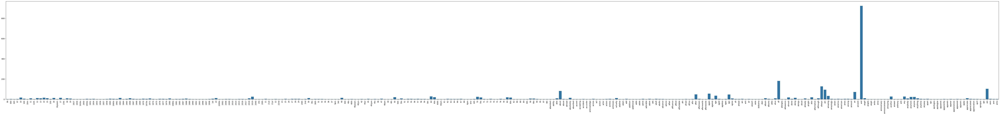

In [152]:
# After aggregating all the frequencies across all documents
# show the first 300 words that have the highest occurences by barplot

plt.subplots(figsize=(100, 10))
g_new = sns.barplot(x=count_vect_new.get_feature_names_out()[:300], 
                    y=term_frequencies_new[:300]) 
g_new.set_xticklabels(count_vect_new.get_feature_names_out()[:300], rotation = 90);

### >>> **Exercise 12 (take home):**
If we want a nicer interactive visualization here, we can try to install and use plotly to achieve this.

In [153]:
# Plot the first 300 high frequency words's occurences in all comments by `plotly`

import plotly.express as px

fig_new_0 = px.bar(x=count_vect_new.get_feature_names_out()[:300], y=term_frequencies_new[:300])
fig_new_0.update_layout(xaxis={'categoryorder':'category ascending'}) # 'total descending' represents the order of the x-axis is based on the total frequency of the terms
fig_new_0.show()

### >>> **Exercise 13 (take home):** 
The chart above only contains 300 vocabulary in the documents, and it's already computationally intensive to both compute and visualize. Can you efficiently reduce the number of terms you want to visualize as an exercise.

In [154]:
# Method 1: by using numpy.argsort() to get the top N terms
 
N = 100
top_indices_new = np.argsort(term_frequencies_new)[-N:]  # get the indices of the top N terms
top_terms_new = count_vect_new.get_feature_names_out()[top_indices_new]
top_freqs_new = term_frequencies_new[top_indices_new]

fig_new_1 = px.bar(x=top_terms_new, y=top_freqs_new)
fig_new_1.update_layout(
    xaxis={'categoryorder':'total descending'},
    title=f'Top {N} Most Frequent Terms',
    xaxis_title='Terms',
    yaxis_title='Frequency'
)
fig_new_1.show()

# This method may lose some information which are important but not much frequent

In [155]:
# Method 2: Use threshold by mean and standard deviation

threshold_new = np.mean(term_frequencies_new) + np.std(term_frequencies_new)
mask_new = term_frequencies_new > threshold_new
filtered_terms_new = count_vect_new.get_feature_names_out()[mask_new]
filtered_freqs_new = term_frequencies_new[mask_new]

# 繪圖
fig_new_2 = px.bar(x=filtered_terms_new, y=filtered_freqs_new)
fig_new_2.update_layout(
    xaxis={'categoryorder':'total descending'},
    title=f'Terms with Frequency > {threshold_new:.0f}',
    xaxis_title='Terms',
    yaxis_title='Frequency'
)
fig_new_2.show()

# Based on the dynamic threshold of the data distribution, it is more flexible

### >>> **Exercise 14 (take home):** 
Additionally, we can attempt to sort the terms on the `x-axis` by frequency instead of in alphabetical order. This way the visualization is more meaninfgul and you will be able to observe the so called [long tail](https://en.wikipedia.org/wiki/Long_tail).

In [157]:
# Use 'total descending' to sort the x-axis

import plotly.express as px

fig_new_4 = px.bar(x=count_vect_new.get_feature_names_out()[:200], y=term_frequencies_new[:200])
fig_new_4.update_layout(xaxis={'categoryorder':'total descending'})
fig_new_4.show()

We can also transform the values in that vector into the log distribution. All we need is to import the `math` library provided by python and apply it to the array of values of the term frequency vector. Now, the variations between the term frequencies are easy to observe.

In [158]:
import math
term_frequencies_new_log = [math.log(i) for i in term_frequencies_new]

C:\Users\USER\AppData\Local\Temp\ipykernel_920\2468923489.py:6: UserWarning:

set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.



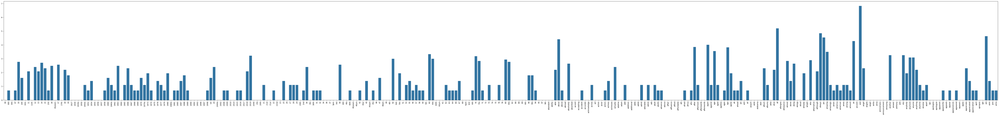

In [159]:
# Show the first 300 high frequency words in the vocabulary by barplot with log scale 

plt.subplots(figsize=(100, 10))
g_new = sns.barplot(x=count_vect_new.get_feature_names_out()[:300],
                    y=term_frequencies_new_log[:300])  
g_new.set_xticklabels(count_vect_new.get_feature_names_out()[:300], rotation = 90);

### >>> **Exercise 15 (take home):** 
Copy the code from the previous exercise and change the 'term_frequencies' variable for the 'term_frequencies_log', comment about the differences that you observe and talk about other possible insights that we can get from a log distribution.

C:\Users\USER\AppData\Local\Temp\ipykernel_920\3490613170.py:13: UserWarning:

set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.



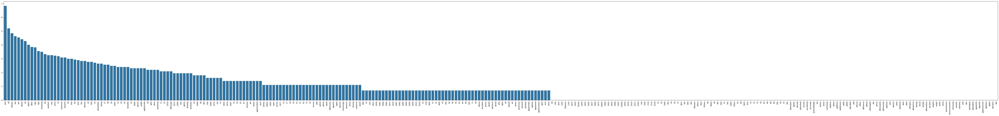

In [160]:
# Calculate the log scale of occurences of the first 300 high frequency words in the vocabulary
terms_and_frequencies_new = sorted(zip(
    count_vect_new.get_feature_names_out()[:300],
    term_frequencies_new_log[:300]
    ), key=lambda x: x[1], reverse=True)

# Get the words and their log scale of occurences after sorting
sorted_terms_new = [term for term, freq in terms_and_frequencies_new]
sorted_frequencies_new = [freq for term, freq in terms_and_frequencies_new]

plt.subplots(figsize=(100, 10))
g_new = sns.barplot(x=sorted_terms_new, y=sorted_frequencies_new)
g_new.set_xticklabels(sorted_terms_new, rotation=90)
plt.show()

# the difference between the two plots is that the y-axis of the second plot is the log of the frequency of the terms,
# which can help to reduce the impact of the high frequency terms, and make the plot more readable,
# especially when the frequency of the terms is highly skewed

###  Finding frequent patterns
In our scenario, what we need is to mine patterns that can be representative to **each category**, in this way we will be able to differentiate each group of data more easily, for that we will need to first modify our document-term matrix to be able to work for each category, for this we will do the following:

In [161]:
import pandas as pd
from sklearn.feature_extraction.text import CountVectorizer

categories_new = X_new['sentiment'].unique()
category_new_dfs = {}

for category in categories_new:
    category_new_dfs[category] = X_new[X_new['sentiment'] == category].copy()

def create_term_document_df(df):
    count_vect = CountVectorizer()
    X_counts = count_vect.fit_transform(df['comment'])

    words = count_vect.get_feature_names_out()
    
    term_document_df = pd.DataFrame(X_counts.toarray(), columns=words)
    
    return term_document_df

filt_term_document_dfs_new = {}

for category in categories_new:
    filt_term_document_dfs_new[category] = create_term_document_df(category_new_dfs[category])

In [162]:
# Display the filtered DataFrame for one of the categories, feel free to change the number in the vector

category_number = 0 # not nostalgia
print(f"Filtered Term-Document Frequency DataFrame for Category {categories_new[category_number]}:")
filt_term_document_dfs_new[categories_new[category_number]] # Display the term-document frequency DataFrame for the selected category

# row: each comment; column: each word;
# value: the number of occurences of each word in each comment

Filtered Term-Document Frequency DataFrame for Category not nostalgia:


,00,000,045,10,100,10m,11,12,14,15,...,youngest,youngsters,your,yourself,youth,youtube,yrs,yuo,zealand,zulus
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
744,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
745,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
746,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
747,0,0,0,0,0,0,0,0,0,0,...,0,0,1,0,0,0,0,0,0,0


In [163]:
# Display the filtered DataFrame for one of the categories, feel free to change the number in the vector

category_number = 1 # nostalgia
print(f"Filtered Term-Document Frequency DataFrame for Category {categories_new[category_number]}:")
filt_term_document_dfs_new[categories_new[category_number]] # Display the term-document frequency DataFrame for the selected category


# row: each comment; column: each word
# value: the number of occurences of each word in each comment

Filtered Term-Document Frequency DataFrame for Category nostalgia:


,07,10,11,11th,12,13,14,15,16,17,...,young,younger,youngster,your,yours,youth,youthful,youtube,yrs,yup
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
745,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
746,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
747,0,0,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
748,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


Now we can see the number of unique words per category based on the column number in the new dataframe, feel free to **explore the changes of each category changing the vector number at the end**.

In the past sections we saw the behaviour of each word frequency in the documents, but we still want to generalize a little bit more so we can observe and determine the data that we are going to use to mine the patterns. For this we will group the terms in bins and we are going to plot their frequency. Again, feel free to change the category number to explore the different results.

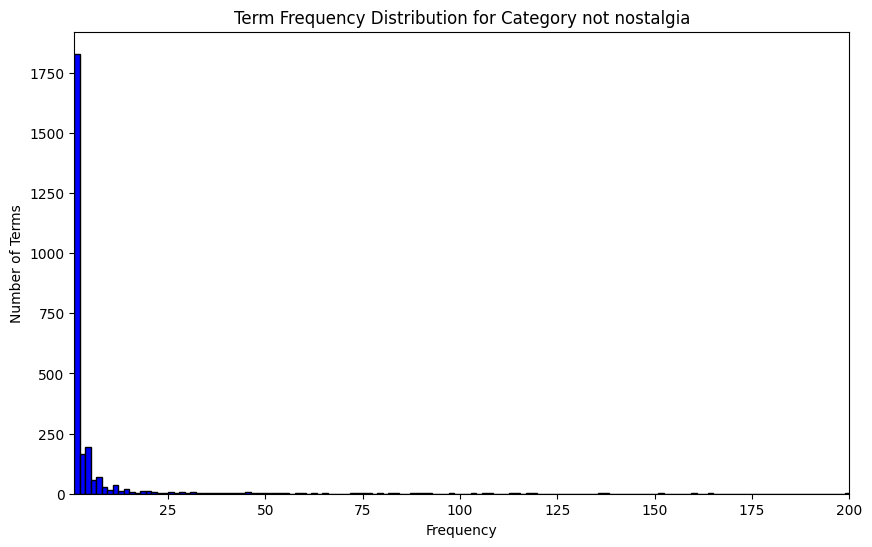

In [164]:
# Sum over all documents to get total frequency for each word
category_number = 0  # not nostalgia
word_counts_new = filt_term_document_dfs_new[categories_new[category_number]].sum(axis=0).to_numpy()
 
# Visualize the frequency distribution
plt.figure(figsize=(10, 6))
plt.hist(word_counts_new, bins=500, color='blue', edgecolor='black')
plt.title(f'Term Frequency Distribution for Category {categories_new[category_number]}')
plt.xlabel('Frequency')
plt.ylabel('Number of Terms')
plt.xlim(1, 200)
plt.show()

From this graph, we can see that most of the words appear very infrequently across the entire dataset, while a small number of words appear quite often. When we're trying to find patterns in text data, we focus on combinations of words that are most helpful for classifying the documents. However, very rare words or extremely common words (like stopwords: 'the,' 'in,' 'a,' 'of,' etc.) don’t usually give us much useful information. To improve our results, we can filter out these words. Specifically, we'll remove the **bottom 1%** of the least frequent words and the **top 5%** of the most frequent ones. This helps us focus on words that might reveal more valuable patterns.

Let us look first at the words that we will be filtering based on the set percentage threshold.

In [165]:
category_number = 0 # not nostalgia
word_counts_new = filt_term_document_dfs_new[categories_new[category_number]].sum(axis=0).to_numpy()

# Sort the term frequencies in descending order
sorted_indices_new = np.argsort(word_counts_new)[::-1]  # Get indices of sorted frequencies
sorted_counts_new = np.sort(word_counts_new)[::-1]  # Sort frequencies in descending order

# Calculate the index corresponding to the top 5% most frequent terms
total_terms_new = len(sorted_counts_new)
top_5_percent_index_new = int(0.05 * total_terms_new)

# Get the indices of the top 5% most frequent terms
top_5_percent_indices_new = sorted_indices_new[:top_5_percent_index_new]

# Filter terms that belong to the top 5% based on their rank
filtered_words_new = [filt_term_document_dfs_new[categories_new[category_number]].iloc[:, i].name for i in top_5_percent_indices_new]

print(f"Category: {categories_new[category_number]}")
print(f"Number of terms in top 5%: {top_5_percent_index_new}")
print(f"Filtered terms: {filtered_words_new}")


Category: not nostalgia
Number of terms in top 5%: 130
Filtered terms: ['the', 'this', 'and', 'to', 'of', 'song', 'it', 'is', 'in', 'you', 'that', 'my', 'love', 'music', 'was', 'for', 'so', 'have', 'one', 'like', 'but', 'he', 'with', 'great', 'all', 'what', 'on', 'not', 'be', 'can', 'me', 'voice', 'just', 'songs', 'beautiful', 'as', 'time', 'her', 'she', 'will', 'they', 'when', 'from', 'his', 'at', 'are', 'always', 'good', 'no', 'know', 'never', 'now', 'about', 'much', 'who', 'really', 'more', 'if', 'we', 'best', 'by', 'ever', 'think', 'would', 'thank', 'only', 'still', 'how', 'don', 'has', 'very', 'am', 'there', 'out', 'him', 'could', 'these', 'up', 'old', 'listen', 'hear', 'do', 'an', 'singer', 'many', 'had', 'here', 'version', 'too', 'such', 'today', 'been', 'world', 'your', 'people', 'most', 'get', 'video', 'heard', 'man', 'some', 'listening', 'sing', 'than', 'were', 'years', 'real', 'heart', 'nice', 'singing', 'their', 'better', 'life', 'its', 'day', 'sad', 'god', 'then', 'way', '

Explore the frequencies of the **top 5%** words:

In [166]:
# The frequencies sorted in a descending order
print(sorted_counts_new)

# The indices corresponding to the words after being sorted in a descending order
print(sorted_indices_new)

# Sum up the column corresponding to the top 5% words, just specify which one first.
print(filt_term_document_dfs_new[categories_new[category_number]].loc[:,'the'].sum(axis=0))

[708 452 451 ...   1   1   1]
[2276 2290  160 ... 2600   12    7]
708


In [167]:
category_number = 0 # not nostalgia
word_counts_new = filt_term_document_dfs_new[categories_new[category_number]].sum(axis=0).to_numpy()

# Sort the term frequencies in ascending order and get sorted indices
sorted_indices_new = np.argsort(word_counts_new)  # Get indices of sorted frequencies
sorted_counts_new = word_counts_new[sorted_indices_new]  # Sort frequencies

# Calculate the index corresponding to the bottom 1% least frequent terms
total_terms_new = len(sorted_counts_new)
bottom_1_percent_index_new = int(0.01 * total_terms_new)

# Get the indices of the bottom 1% least frequent terms
bottom_1_percent_indices_new = sorted_indices_new[:bottom_1_percent_index_new]

# Filter terms that belong to the bottom 1% based on their rank
filtered_words_new = [filt_term_document_dfs_new[categories_new[category_number]].iloc[:, i].name for i in bottom_1_percent_indices_new]

print(f"Category: {categories_new[category_number]}")
print(f"Number of terms in bottom 1%: {bottom_1_percent_index_new}")
print(f"Filtered terms: {filtered_words_new}")


Category: not nostalgia
Number of terms in bottom 1%: 26
Filtered terms: ['12', '16years', 'zealand', 'sensitive', 'sense', 'xd', 'wwii', 'wuv', 'writers', 'writer', 'wrenching', 'wouldn', '1998', 'measure', 'spine', 'spewing', '2040', '2018', '2017', '2010', '1957', '1955', '1952', '1930s', '1930', '17th']


Explore the frequencies of the **bottom 1%** words:

In [168]:
# See the frequencies sorted in an ascending order
print(sorted_counts_new)

# The indices corresponding to the words after being sorted in an ascending order
print(sorted_indices_new)

# Sum up the column corresponding to the bottom 1% words, we just specify which one first.
print(filt_term_document_dfs_new[categories_new[category_number]].loc[:,'12'].sum(axis=0))

[  1   1   1 ... 451 452 708]
[   7   12 2600 ...  160 2290 2276]
1


Now that we have seen what type of words are inside the thresholds we set, then we can procede to **filter them out of the dataframe**.

In [169]:
category_number = 0  # not nostalgia

def filter_top_bottom_words_by_sum(term_document_df, top_percent=0.05, bottom_percent=0.01):
    word_sums = term_document_df.sum(axis=0)
    
    sorted_words = word_sums.sort_values()
    
    total_words = len(sorted_words)
    top_n = int(top_percent * total_words)
    bottom_n = int(bottom_percent * total_words)
    
    words_to_remove = pd.concat([sorted_words.head(bottom_n), sorted_words.tail(top_n)]).index
    print(f'Bottom {bottom_percent*100}% words: \n{sorted_words.head(bottom_n)}') #Here we print which words correspond to the bottom percentage we filter
    print(f'Top {top_percent*100}% words: \n{sorted_words.tail(top_n)}') #Here we print which words correspond to the top percentage we filter
    return term_document_df.drop(columns=words_to_remove)

term_document_dfs_new = {}

for category in categories_new:
    print(f'\nFor category {category} we filter the following words:')
    term_document_dfs_new[category] = filter_top_bottom_words_by_sum(filt_term_document_dfs_new[category])

for i in range(len(categories_new)):
    print(f"Filtered Term-Document Frequency DataFrame for Category {categories_new[i]}:")
    display(filt_term_document_dfs_new[categories_new[i]]) 


For category not nostalgia we filter the following words:
Bottom 1.0% words: 
12           1
16years      1
zealand      1
sensitive    1
sense        1
xd           1
wwii         1
wuv          1
writers      1
writer       1
wrenching    1
wouldn       1
1998         1
measure      1
spine        1
spewing      1
2040         1
2018         1
2017         1
2010         1
1957         1
1955         1
1952         1
1930s        1
1930         1
17th         1
dtype: int64
Top 5.0% words: 
first       23
got         23
amazing     23
wish        24
any         25
          ... 
of         361
to         394
and        451
this       452
the        708
Length: 130, dtype: int64

For category nostalgia we filter the following words:
Bottom 1.0% words: 
yo         1
yet        1
yester     1
yeas       1
yearn      1
yeah       1
1952       1
1950       1
1969       1
1964       1
lp         1
safety     1
safer      1
saddest    1
seeing     1
lou        1
proud      1
protest    1
2

,00,000,045,10,100,10m,11,12,14,15,...,youngest,youngsters,your,yourself,youth,youtube,yrs,yuo,zealand,zulus
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
744,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
745,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
746,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
747,0,0,0,0,0,0,0,0,0,0,...,0,0,1,0,0,0,0,0,0,0


Filtered Term-Document Frequency DataFrame for Category nostalgia:


,07,10,11,11th,12,13,14,15,16,17,...,young,younger,youngster,your,yours,youth,youthful,youtube,yrs,yup
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
745,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
746,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
747,0,0,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
748,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


### >>> **Exercise 16 (take home):** 
Review the words that were filtered in each category and comment about the differences and similarities that you can see.

#### Answer:

Comparing the filtered words from the "nostalgia" and "not nostalgia" categories reveals a few key points:

1. **Time-Related Words**: Both categories have rare references to specific years, indicating occasional historical mentions.

2. **Emotional Words**: "Nostalgia" features words like "saddest" and "proud," while "not nostalgia" includes terms like "sensitive" and "wrenching," highlighting different emotional tones.

3. **Common Stop Words**: Both categories share high-frequency stop words like "the," "to," and "and."

In summary, both categories share common structures, but their emotional tones and temporal references differ.

<hr>

Now that our document-term frequency dataframe is ready, we can proceed with the frequent pattern mining process. To do this, we first need to convert our dataframe into a transactional database that the PAMI library can work with. We will generate a CSV file for each category to create this database.

In [170]:
from PAMI.extras.convert.DF2DB import DF2DB            

for category in term_document_dfs_new:
    category_safe = category.replace(' ', '_')

    obj = DF2DB(term_document_dfs_new[category])           
        
    obj.convert2TransactionalDatabase(f'td_freq_db_{category_safe}.csv', '>=', 1)

Database size (total no of transactions) : 734
Number of items : 2159
Minimum Transaction Size : 1
Average Transaction Size : 8.696185286103542
Maximum Transaction Size : 39
Standard Deviation Transaction Size : 7.20498326251217
Variance in Transaction Sizes : 51.982604800547186
Sparsity : 0.9959721235358483


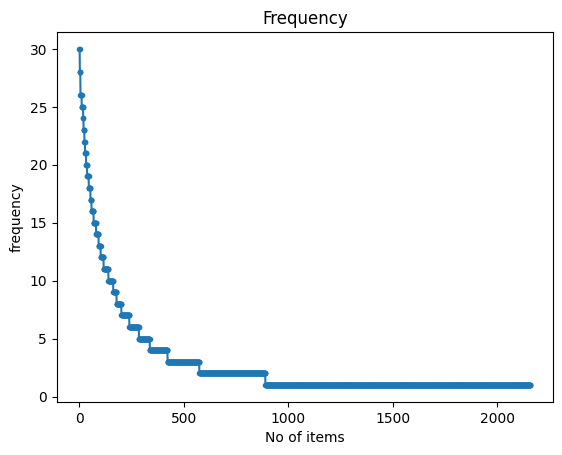

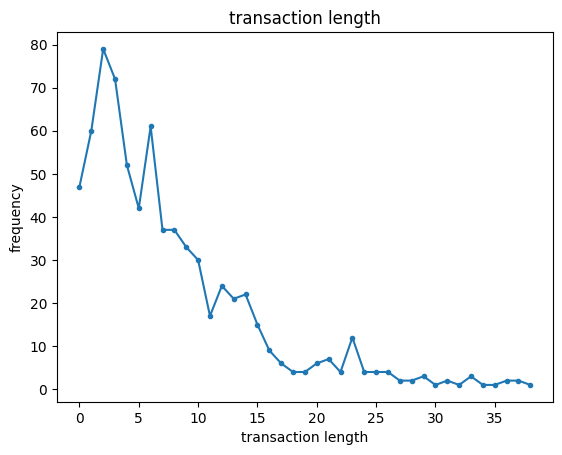

In [171]:
from PAMI.extras.dbStats import TransactionalDatabase as tds
obj_new_1 = tds.TransactionalDatabase('td_freq_db_nostalgia.csv')
obj_new_1.run()
obj_new_1.printStats()
obj_new_1.plotGraphs()

Database size (total no of transactions) : 746
Number of items : 2446
Minimum Transaction Size : 1
Average Transaction Size : 8.399463806970509
Maximum Transaction Size : 47
Standard Deviation Transaction Size : 5.940834266064001
Variance in Transaction Sizes : 35.3408856181514
Sparsity : 0.9965660409619908


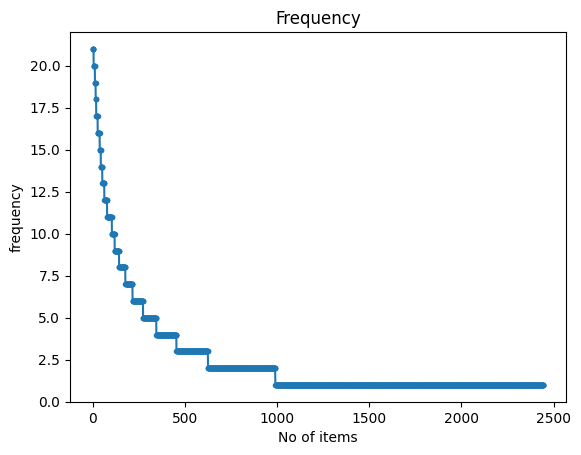

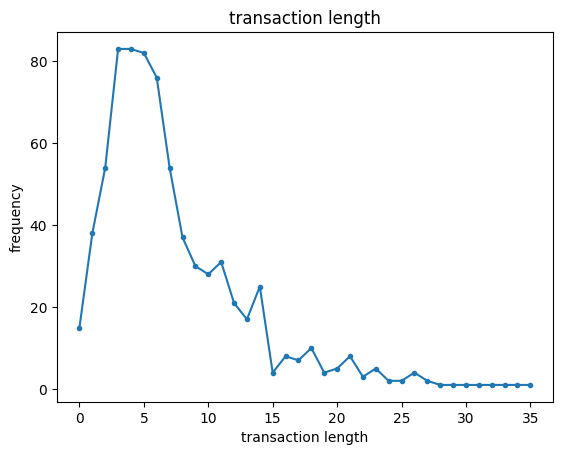

In [172]:
from PAMI.extras.dbStats import TransactionalDatabase as tds
obj_new_2 = tds.TransactionalDatabase('td_freq_db_not_nostalgia.csv')
obj_new_2.run()
obj_new_2.printStats()
obj_new_2.plotGraphs()

Set minSup at 9, we focus on combinations of items that show up in these smaller, more common transactions.

In [173]:
from PAMI.frequentPattern.basic import FPGrowth as alg
minSup_new = 9
obj1_new = alg.FPGrowth(iFile='td_freq_db_nostalgia.csv', minSup=minSup_new)
obj1_new.mine()
frequentPatternsDF_nostaligia = obj1_new.getPatternsAsDataFrame()
print('Total No of patterns: ' + str(len(frequentPatternsDF_nostaligia)))
print('Runtime: ' + str(obj1_new.getRuntime()))

Frequent patterns were generated successfully using frequentPatternGrowth algorithm
Total No of patterns: 180
Runtime: 0.029098033905029297


In [174]:
obj1_new.save('freq_patterns_nostalgia_minSup9.txt')
frequentPatternsDF_nostaligia

,Patterns,Support
0,find,9
1,down,9
2,few,9
3,its,9
4,sure,9
...,...,...
175,ever,28
176,would,28
177,go,28
178,takes,30


In [175]:
from PAMI.frequentPattern.basic import FPGrowth as alg
minSup_new = 9
obj2_new = alg.FPGrowth(iFile='td_freq_db_not_nostalgia.csv', minSup=minSup_new)
obj2_new.mine()
frequentPatternsDF_not_nostaligia = obj2_new.getPatternsAsDataFrame()
print('Total No of patterns: ' + str(len(frequentPatternsDF_not_nostaligia)))
print('Runtime: ' + str(obj2_new.getRuntime()))

Frequent patterns were generated successfully using frequentPatternGrowth algorithm
Total No of patterns: 144
Runtime: 0.018651962280273438


In [176]:
obj2_new.save('freq_patterns_not_nostalgia_minSup9.txt')
frequentPatternsDF_not_nostaligia

,Patterns,Support
0,favorites,9
1,special,9
2,soul,9
3,mind,9
4,60,9
...,...,...
139,every,21
140,loved,21
141,classic,21
142,them,21


Integrate them effectively with our initial data for further analysis. To identify and use only the unique patterns that are specific to each category.

In [177]:
import pandas as pd

dfs_new = [frequentPatternsDF_nostaligia, frequentPatternsDF_not_nostaligia]

pattern_counts_new = {}
for df in dfs_new:
    for pattern in df['Patterns']:
        if pattern not in pattern_counts_new:
            pattern_counts_new[pattern] = 1
        else:
            pattern_counts_new[pattern] += 1

unique_patterns_new = {pattern for pattern, count in pattern_counts_new.items() if count == 1}
total_patterns_count_new = sum(len(df) for df in dfs_new)
discarded_patterns_count_new = total_patterns_count_new - len(unique_patterns_new)

filtered_dfs_new = []
for df in dfs_new:
    filtered_df_new = df[df['Patterns'].isin(unique_patterns_new)]
    filtered_dfs_new.append(filtered_df_new)

final_pattern_df_new = pd.concat(filtered_dfs_new, ignore_index=True)

final_pattern_df_new = final_pattern_df_new.sort_values(by='Support', ascending=False)

print(final_pattern_df_new)
print(f"Number of patterns discarded: {discarded_patterns_count_new}")

    Patterns  Support
127    takes       30
125     ever       28
126    would       28
123       or       26
120      kid       26
..       ...      ...
135   others        9
136     pure        9
137   please        9
138   though        9
139   wonder        9

[220 rows x 2 columns]
Number of patterns discarded: 104


Integrate these now category-specific patterns into our data. If a pattern is found in the document, we'll mark it with a '1'; if it's not present, we'll mark it with a '0'.

In [178]:
import pandas as pd
from sklearn.feature_extraction.text import CountVectorizer

count_vect_new = CountVectorizer()
X_tdm_new = count_vect_new.fit_transform(X_new['comment'])
terms_new = count_vect_new.get_feature_names_out()

X_new['tokenized_comment'] = X_new['comment'].str.split().apply(set)

pattern_matrix_new = pd.DataFrame(0, index=X_new.index, columns=final_pattern_df_new['Patterns'])

for pattern in final_pattern_df_new['Patterns']:
    pattern_words_new = set(pattern.split())
    pattern_matrix_new[pattern] = X_new['tokenized_comment'].apply(lambda x: 1 if pattern_words_new.issubset(x) else 0)

tdm_df_new = pd.DataFrame(X_tdm_new.toarray(), columns=terms_new, index=X_new.index)

augmented_df_new = pd.concat([tdm_df_new, pattern_matrix_new], axis=1)
augmented_df_new

,00,000,045,07,10,100,10m,11,11th,12,...,almost,end,family,ones,things,others,pure,please,though,wonder
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1495,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1496,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1497,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1498,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0


### >>> **Exercise 17 (take home):** 
Implement the FAE Top-K and MaxFPGrowth algorithms from the PAMI library to analyze the 'nostalgia' category in our processed database. **Only implement the mining part of the algorithm and display the resulting patterns**, like we did with the FPGrowth algorithm after creating the new databases. For the FAE Top-K, run trials with k values of 500, 1000, and 1500, recording the runtime for each. For MaxFPGrowth, test minimum support thresholds of 3, 6, and 9, noting the runtime for these settings as well. Compare the patterns these algorithms extract with those from the previously implemented FPGrowth algorithm. Document your findings, focusing on differences and similarities in the outputs and performance.

In [179]:
from PAMI.frequentPattern.topk.FAE import FAE as alg

k_values = [500, 650, 800]

for k in k_values:
    print(f"Running FAE Top-K with k={k}")
    
    obj_topk_new = alg(iFile='td_freq_db_nostalgia.csv', k=k)
    obj_topk_new.mine()
    frequentPatternsDF_topk_new = obj_topk_new.getPatternsAsDataFrame()
    print(f"Total No of patterns with k={k}: " + str(len(frequentPatternsDF_topk_new)))
    print(f"Runtime with k={k}: " + str(obj_topk_new.getRuntime()))
    obj_topk_new.save(f'pattern/topk/freq_patterns_nostalgia_topk_{k}.txt')

    display(frequentPatternsDF_topk_new)

Running FAE Top-K with k=500
 TopK frequent patterns were successfully generated using FAE algorithm.
Total No of patterns with k=500: 500
Runtime with k=500: 0.15016412734985352


,Patterns,Support
0,takes,30
1,favorite,30
2,ever,28
3,would,28
4,go,28
...,...,...
495,reason,3
496,whatever,3
497,artists,3
498,august,3


Running FAE Top-K with k=650
 TopK frequent patterns were successfully generated using FAE algorithm.
Total No of patterns with k=650: 650
Runtime with k=650: 0.19415760040283203


,Patterns,Support
0,takes,30
1,favorite,30
2,ever,28
3,would,28
4,go,28
...,...,...
645,or over,3
646,or been,3
647,or no,3
648,know or didn,3


Running FAE Top-K with k=800
 TopK frequent patterns were successfully generated using FAE algorithm.
Total No of patterns with k=800: 800
Runtime with k=800: 1.5034050941467285


,Patterns,Support
0,takes,30
1,favorite,30
2,ever,28
3,would,28
4,go,28
...,...,...
795,been too,3
796,been later,3
797,been 10,3
798,been brother,3


In [180]:
# From the results, we can see that the number of patterns decreases as the value of k increases.
# Additionally, the runtime also increases as the value of k increases.
# This is because the algorithm needs to find more patterns when k is higher, which requires more computational resources.
# Even though the runtime increases, the algorithm is still efficient and can handle large datasets.
# So it's important to choose the appropriate value of k based on the dataset size and the desired number of patterns.

In [181]:
from PAMI.frequentPattern.maximal import MaxFPGrowth as alg

# 設定min support值
min_supports = [3, 6, 9]

for min_sup in min_supports:
    print(f"Running MaxFPGrowth with minSup={min_sup}")
    obj_maxfp_new = alg.MaxFPGrowth(iFile='td_freq_db_nostalgia.csv', minSup=min_sup)
    obj_maxfp_new.mine()
    frequentPatternsDF_maxfp_new = obj_maxfp_new.getPatternsAsDataFrame()
    print(f"Total No of patterns with minSup={min_sup}: " + str(len(frequentPatternsDF_maxfp_new)))
    print(f"Runtime with minSup={min_sup}: " + str(obj_maxfp_new.getRuntime()))  # 記錄運行時間
    obj_maxfp_new.save(f'pattern/maxfp/freq_patterns_nostalgia_maxfp_minSup{min_sup}.txt')
    
    display(frequentPatternsDF_maxfp_new)


Running MaxFPGrowth with minSup=3
Maximal Frequent patterns were generated successfully using MaxFp-Growth algorithm 
Total No of patterns with minSup=3: 671
Runtime with minSup=3: 0.060430288314819336


,Patterns,Support
0,skating,3
1,walker,3
2,scott,3
3,17 1987,3
4,stop,3
...,...,...
666,only or,3
667,go or,3
668,ever only,3
669,would only,4


Running MaxFPGrowth with minSup=6
Maximal Frequent patterns were generated successfully using MaxFp-Growth algorithm 
Total No of patterns with minSup=6: 275
Runtime with minSup=6: 0.02094721794128418


,Patterns,Support
0,1973,6
1,looking,6
2,actually,6
3,fast,6
4,innocent,6
...,...,...
270,kid,26
271,would,28
272,ever,28
273,favorite,30


Running MaxFPGrowth with minSup=9
Maximal Frequent patterns were generated successfully using MaxFp-Growth algorithm 
Total No of patterns with minSup=9: 176
Runtime with minSup=9: 0.028438568115234375


,Patterns,Support
0,karen,9
1,right,9
2,place,9
3,records,9
4,yes,9
...,...,...
171,go,28
172,would,28
173,ever,28
174,favorite,30


- In the comp.graphics category, the number of frequent patterns mined by FAE Top-K and MaxFPGrowth will be less than FPGrowth

- And from the result, we can see that as the k value increases, the number of frequent patterns mined by FAE Top-K will also increase, while MaxFPGrowth will decrease as the min

- From the performance point of view, FAE Top-K and MaxFPGrowth can find more frequent patterns in a shorter time

### 5.5 Dimensionality Reduction

From our previous work we have our data with only the document-term frequency data and also the one with both the document-term frequency and the pattern derived data, let's try to create a 2D plot after applying these algorithms to our dataframes and see what comes out.

In [184]:
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
import umap.umap_ as umap
import matplotlib.pyplot as plt

X_pca_tdm_new = PCA(n_components=2).fit_transform(tdm_df_new.values)
X_tsne_tdm_new = TSNE(n_components=2).fit_transform(tdm_df_new.values)
X_umap_tdm_new = umap.UMAP(n_components=2).fit_transform(tdm_df_new.values)

In [185]:
print('Shape of X_pca_tdm_new : ', X_pca_tdm_new.shape)
print('Shape of X_tsne_tdm_new : ', X_tsne_tdm_new.shape)
print('Shape of X_umap_tdm_new : ', X_umap_tdm_new.shape)

Shape of X_pca_tdm_new :  (1499, 2)
Shape of X_tsne_tdm_new :  (1499, 2)
Shape of X_umap_tdm_new :  (1499, 2)


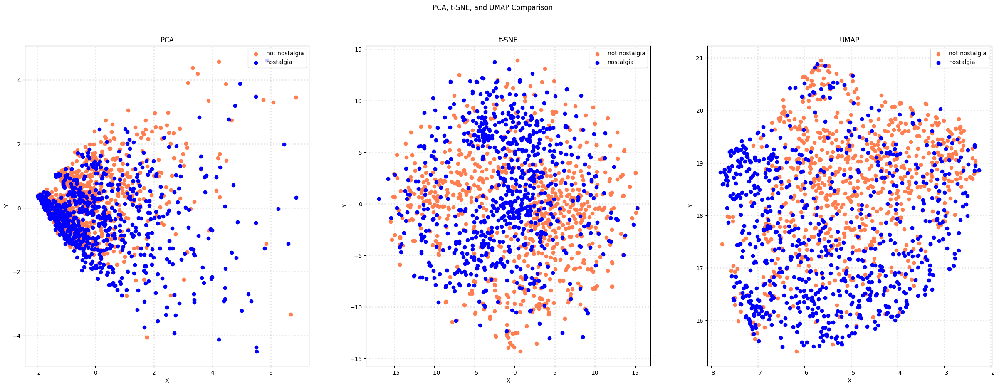

In [186]:
col_new = ['coral', 'blue']
categories_new = X_new['sentiment'].unique() 

fig, axes = plt.subplots(1, 3, figsize=(30, 10))
fig.suptitle('PCA, t-SNE, and UMAP Comparison')

def plot_scatter_new(ax, X_reduced, title):
    for c, category in zip(col_new, categories_new):
        xs = X_reduced[X_new['sentiment'] == category].T[0]
        ys = X_reduced[X_new['sentiment'] == category].T[1]
        ax.scatter(xs, ys, c=c, marker='o', label=category)
    
    ax.grid(color='gray', linestyle=':', linewidth=2, alpha=0.2)
    ax.set_title(title)
    ax.set_xlabel('X')
    ax.set_ylabel('Y')
    ax.legend(loc='upper right')

plot_scatter_new(axes[0], X_pca_tdm_new, 'PCA')
plot_scatter_new(axes[1], X_tsne_tdm_new, 't-SNE')
plot_scatter_new(axes[2], X_umap_tdm_new, 'UMAP')

plt.show()

Try in tandem with our pattern augmented data:

In [187]:
X_pca_aug_new = PCA(n_components=2).fit_transform(augmented_df_new.values)
X_tsne_aug_new = TSNE(n_components=2).fit_transform(augmented_df_new.values)
X_umap_aug_new = umap.UMAP(n_components=2).fit_transform(augmented_df_new.values)

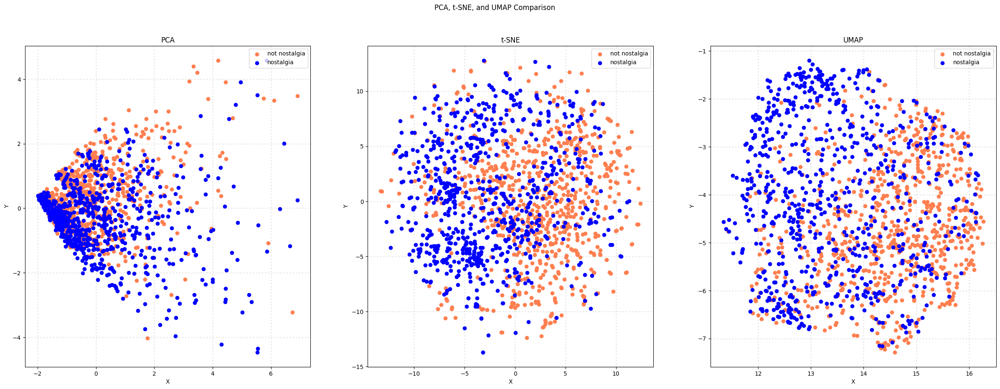

In [188]:
col_new = ['coral', 'blue']
categories_new = X_new['sentiment'].unique() 

fig, axes = plt.subplots(1, 3, figsize=(30, 10))
fig.suptitle('PCA, t-SNE, and UMAP Comparison')

def plot_scatter_new(ax, X_reduced, title):
    for c, category in zip(col_new, categories_new):
        xs = X_reduced[X_new['sentiment'] == category].T[0]
        ys = X_reduced[X_new['sentiment'] == category].T[1]
        ax.scatter(xs, ys, c=c, marker='o', label=category)
    
    ax.grid(color='gray', linestyle=':', linewidth=2, alpha=0.2)
    ax.set_title(title)
    ax.set_xlabel('X')
    ax.set_ylabel('Y')
    ax.legend(loc='upper right')

plot_scatter_new(axes[0], X_pca_aug_new, 'PCA')
plot_scatter_new(axes[1], X_tsne_aug_new, 't-SNE')
plot_scatter_new(axes[2], X_umap_aug_new, 'UMAP')

plt.show()

### >>> Exercise 18 (take home):
Please try to reduce the dimension to 3, and plot the result use 3-D plot. Use at least 3 different angle (camera position) to check your result and describe what you found.

$Hint$: you can refer to Axes3D in the documentation.

In [189]:
X_pca_aug_3_new = PCA(n_components=3).fit_transform(augmented_df_new.values)
X_tsne_aug_3_new = TSNE(n_components=3).fit_transform(augmented_df_new.values)
X_umap_aug_3_new = umap.UMAP(n_components=3).fit_transform(augmented_df_new.values)

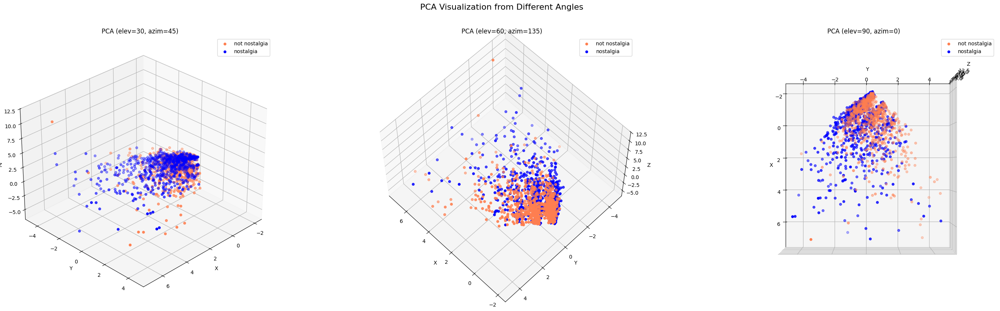

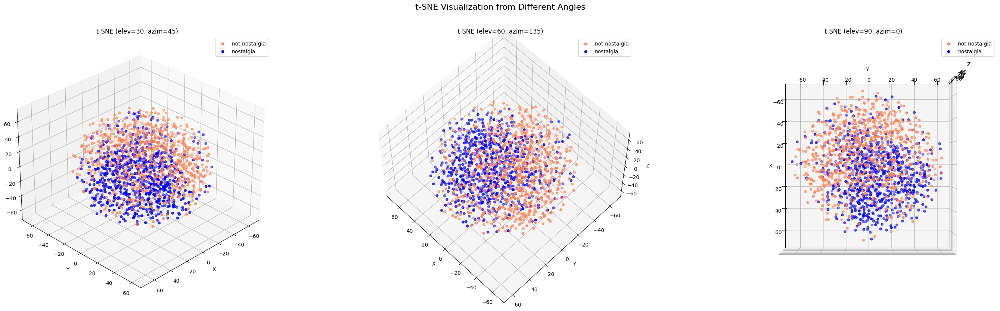

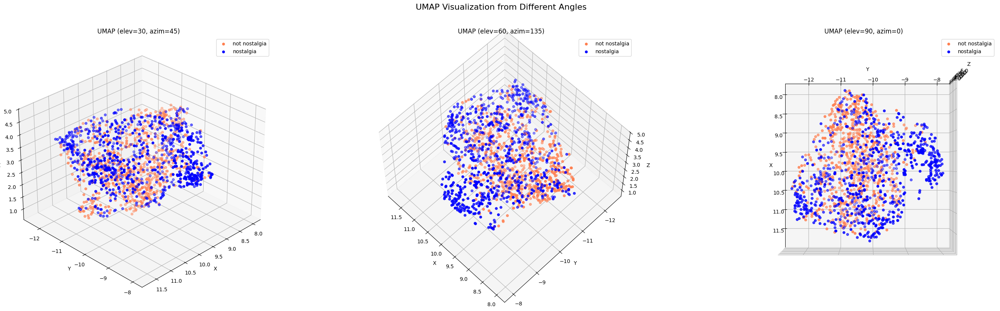

In [191]:
from mpl_toolkits.mplot3d import Axes3D
import matplotlib.pyplot as plt

col_new = ['coral', 'blue']
categories_new = X_new['sentiment'].unique()

views = [(30, 45), (60, 135), (90, 0)]

def plot_scatter_3d(pos, data, title, view_angle):
    ax = fig.add_subplot(1, 3, pos, projection='3d')
    
    for c, category in zip(col_new, categories_new):
        mask = X_new['sentiment'] == category
        xs = data[mask, 0]
        ys = data[mask, 1]
        zs = data[mask, 2]
        ax.scatter(xs, ys, zs, c=c, marker='o', label=category)
    
    ax.grid(color='gray', linestyle=':', linewidth=0.5, alpha=0.2)
    ax.set_title(f'{title} (elev={view_angle[0]}, azim={view_angle[1]})')
    ax.set_xlabel('X')
    ax.set_ylabel('Y')
    ax.set_zlabel('Z')
    ax.legend(loc='upper right')
    
    ax.view_init(elev=view_angle[0], azim=view_angle[1])

data_methods_new = [
    (X_pca_aug_3_new, 'PCA'),
    (X_tsne_aug_3_new, 't-SNE'),
    (X_umap_aug_3_new, 'UMAP')
]

for data, method_title in data_methods_new:
    fig = plt.figure(figsize=(30, 8))
    fig.suptitle(f'{method_title} Visualization from Different Angles', fontsize=16, y=1.02)
    
    for i, view in enumerate(views, 1):
        plot_scatter_3d(i, data, method_title, view)
    
    plt.tight_layout()
    plt.show()

### 5.6 Discretization and Binarization

In [192]:
from sklearn import preprocessing, metrics, decomposition, pipeline, dummy
mlb_new = preprocessing.LabelBinarizer()
mlb_new.fit(X_new.category)
X_new['bin_category'] = mlb_new.transform(X_new['category']).tolist()
X_new[0:9]

# Since the number of categories is 2, so the length of the bin_category is 1 for each row.

,sentiment,comment,category,unigrams,tokenized_comment,bin_category
0,not nostalgia,He was a singer with a golden voice that I lov...,0,"[He, was, a, singer, with, a, golden, voice, t...","{Lord, love, in, of, golden, singer, we, many,...",[0]
1,nostalgia,The mist beautiful voice ever I listened to hi...,1,"[The, mist, beautiful, voice, ever, I, listene...","{when, love, of, mist, him, singing, voice, ki...",[1]
2,nostalgia,I have most of Mr. Reeves songs. Always love ...,1,"[I, have, most, of, Mr., Reeves, songs, ., Alw...","{early., town, most, love, grow, of, songs., a...",[1]
3,not nostalgia,30 day leave from 1st tour in Viet Nam to conv...,0,"[30, day, leave, from, 1st, tour, in, Viet, Na...","{when, in, of, song, who, came, Lou, convince,...",[0]
4,nostalgia,listening to his songs reminds me of my mum wh...,1,"[listening, to, his, songs, reminds, me, of, m...","{played, of, my, his, who, everyday, songs, me...",[1]
5,nostalgia,"Every time I heard this song as a child, I use...",1,"[Every, time, I, heard, this, song, as, a, chi...","{Now, souls., reminded, of, song, many, RIP, a...",[1]
6,nostalgia,"My dad loved listening to Jim Reeves, when I w...",1,"[My, dad, loved, listening, to, Jim, Reeves, ,...","{70's, when, in, didn't, the, how, dad, Jim, a...",[1]
7,nostalgia,i HAVE ALSO LISTENED TO Jim Reeves since child...,1,"[i, HAVE, ALSO, LISTENED, TO, Jim, Reeves, sin...","{comes, i, love, in, LISTENED, he, the, Jim, c...",[1]
8,not nostalgia,Wherever you are you always in my heart,0,"[Wherever, you, are, you, always, in, my, heart]","{in, my, always, are, Wherever, you, heart}",[0]


### >>> **Exercise 19 (take home):**
Try to generate the binarization using the `category_name` column instead. Does it work?

In [193]:
# generate the binarization using the `category_name` instead
mlb_new_ = preprocessing.LabelBinarizer()
mlb_new_.fit(X_new.sentiment)
X_new['bin_category_name'] = mlb_new_.transform(X_new.sentiment).tolist()
X_new[0:9]

# Now we can see that the `bin_category_name` column contains the binarized values for the `category_name` column

,sentiment,comment,category,unigrams,tokenized_comment,bin_category,bin_category_name
0,not nostalgia,He was a singer with a golden voice that I lov...,0,"[He, was, a, singer, with, a, golden, voice, t...","{Lord, love, in, of, golden, singer, we, many,...",[0],[1]
1,nostalgia,The mist beautiful voice ever I listened to hi...,1,"[The, mist, beautiful, voice, ever, I, listene...","{when, love, of, mist, him, singing, voice, ki...",[1],[0]
2,nostalgia,I have most of Mr. Reeves songs. Always love ...,1,"[I, have, most, of, Mr., Reeves, songs, ., Alw...","{early., town, most, love, grow, of, songs., a...",[1],[0]
3,not nostalgia,30 day leave from 1st tour in Viet Nam to conv...,0,"[30, day, leave, from, 1st, tour, in, Viet, Na...","{when, in, of, song, who, came, Lou, convince,...",[0],[1]
4,nostalgia,listening to his songs reminds me of my mum wh...,1,"[listening, to, his, songs, reminds, me, of, m...","{played, of, my, his, who, everyday, songs, me...",[1],[0]
5,nostalgia,"Every time I heard this song as a child, I use...",1,"[Every, time, I, heard, this, song, as, a, chi...","{Now, souls., reminded, of, song, many, RIP, a...",[1],[0]
6,nostalgia,"My dad loved listening to Jim Reeves, when I w...",1,"[My, dad, loved, listening, to, Jim, Reeves, ,...","{70's, when, in, didn't, the, how, dad, Jim, a...",[1],[0]
7,nostalgia,i HAVE ALSO LISTENED TO Jim Reeves since child...,1,"[i, HAVE, ALSO, LISTENED, TO, Jim, Reeves, sin...","{comes, i, love, in, LISTENED, he, the, Jim, c...",[1],[0]
8,not nostalgia,Wherever you are you always in my heart,0,"[Wherever, you, are, you, always, in, my, heart]","{in, my, always, are, Wherever, you, heart}",[0],[1]


# 6. Data Exploration

Sometimes you need to take a peek at your data to understand the relationships in your dataset. Here, we will focus in a similarity example. Let's take 3 documents and compare them.

In [194]:
# We retrieve 3 sentences for a random record
document_to_transform_1_new = []
random_record_1_new = X_new.iloc[50]
random_record_1_new = random_record_1_new['comment']
document_to_transform_1_new.append(random_record_1_new)

document_to_transform_2_new = []
random_record_2_new = X_new.iloc[100]
random_record_2_new = random_record_2_new['comment']
document_to_transform_2_new.append(random_record_2_new)

document_to_transform_3_new = []
random_record_3_new = X_new.iloc[150]
random_record_3_new = random_record_3_new['comment']
document_to_transform_3_new.append(random_record_3_new)

# Look at the first 3 comments
print(document_to_transform_1_new)
print(document_to_transform_2_new)
print(document_to_transform_3_new)

['If I remember correctly, this song came out after Mr. Reeves passed away. I was about 10 years old when the disc jockey said that the news just came over the wire that he died in a plane crash.']
['i guess most of us leave it too late before we tell someone just how much we really love them']
['my name is thomas but know by tommy and my wifes name is laura and i always sing this to her']


In [195]:
from sklearn.preprocessing import binarize

# Transform sentence with Vectorizers
document_vector_count_1_new = count_vect_new.transform(document_to_transform_1_new)
document_vector_count_2_new = count_vect_new.transform(document_to_transform_2_new)
document_vector_count_3_new = count_vect_new.transform(document_to_transform_3_new)

# Binarize vectors to simplify: 0 for abscence, 1 for prescence
document_vector_count_1_bin_new = binarize(document_vector_count_1_new)
document_vector_count_2_bin_new = binarize(document_vector_count_2_new)
document_vector_count_3_bin_new = binarize(document_vector_count_3_new)

# print vectors
print("Let's take a look at the count vectors:")
print(document_vector_count_1_new.todense())
print(document_vector_count_2_new.todense())
print(document_vector_count_3_new.todense())

Let's take a look at the count vectors:
[[0 0 0 ... 0 0 0]]
[[0 0 0 ... 0 0 0]]
[[0 0 0 ... 0 0 0]]


In [196]:
from sklearn.metrics.pairwise import cosine_similarity

# Calculate Cosine Similarity
cos_sim_count_1_2_new = cosine_similarity(document_vector_count_1_new, document_vector_count_2_new, dense_output=True)
cos_sim_count_1_3_new = cosine_similarity(document_vector_count_1_new, document_vector_count_3_new, dense_output=True)
cos_sim_count_2_3_new = cosine_similarity(document_vector_count_2_new, document_vector_count_3_new, dense_output=True)

cos_sim_count_1_1_new = cosine_similarity(document_vector_count_1_new, document_vector_count_1_new, dense_output=True)
cos_sim_count_2_2_new = cosine_similarity(document_vector_count_2_new, document_vector_count_2_new, dense_output=True)
cos_sim_count_3_3_new = cosine_similarity(document_vector_count_3_new, document_vector_count_3_new, dense_output=True)

# Print 
print("Cosine Similarity using count bw 1 and 2: %(x)f" %{"x":cos_sim_count_1_2_new})
print("Cosine Similarity using count bw 1 and 3: %(x)f" %{"x":cos_sim_count_1_3_new})
print("Cosine Similarity using count bw 2 and 3: %(x)f" %{"x":cos_sim_count_2_3_new})

print("Cosine Similarity using count bw 1 and 1: %(x)f" %{"x":cos_sim_count_1_1_new})
print("Cosine Similarity using count bw 2 and 2: %(x)f" %{"x":cos_sim_count_2_2_new})
print("Cosine Similarity using count bw 3 and 3: %(x)f" %{"x":cos_sim_count_3_3_new})

Cosine Similarity using count bw 1 and 2: 0.032174
Cosine Similarity using count bw 1 and 3: 0.027864
Cosine Similarity using count bw 2 and 3: 0.000000
Cosine Similarity using count bw 1 and 1: 1.000000
Cosine Similarity using count bw 2 and 2: 1.000000
Cosine Similarity using count bw 3 and 3: 1.000000


C:\Users\USER\AppData\Local\Temp\ipykernel_920\3861556521.py:13: DeprecationWarning:

Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)

C:\Users\USER\AppData\Local\Temp\ipykernel_920\3861556521.py:14: DeprecationWarning:

Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)

C:\Users\USER\AppData\Local\Temp\ipykernel_920\3861556521.py:15: DeprecationWarning:

Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)

C:\Users\USER\AppData\Local\Temp\ipykernel_920\3861556521.py:17: DeprecationWarning:

Conversion of an array with ndim > 0 to a scalar i

As expected, cosine similarity between a sentence and itself is 1. Between 2 entirely different sentences, it will be 0. 

We can assume that we have the more common features in the documents 1 and 3 than in documents 1 and 2. This reflects indeed in a higher similarity than that of sentences 1 and 3. 


---

# 7. Data Classification
    
We will implement a Multinomial Naive Bayes, for that we first choose how to split our data, in this case we will follow a typical **70/30 split for the training and test set**. Let's see a comparison of what we obtain when classifying our data without patterns vs our data with the patterns.

In [197]:
#Model with only the document-term frequency data
import pandas as pd
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.model_selection import train_test_split
from sklearn.naive_bayes import MultinomialNB
from sklearn.metrics import classification_report, accuracy_score

# Create a mapping from numerical labels to category names
category_mapping_new = dict(X_new[['category', 'sentiment']].drop_duplicates().values)

# Convert the numerical category labels to text labels
target_names_new = [category_mapping_new[label] for label in sorted(category_mapping_new.keys())]

# Split the data into training and testing sets (70% train, 30% test)
X_train_new, X_test_new, y_train_new, y_test_new = train_test_split(tdm_df_new, X_new['category'], test_size=0.3, random_state=42)

In [198]:
X_train_new

,00,000,045,07,10,100,10m,11,11th,12,...,yours,yourself,youth,youthful,youtube,yrs,yuo,yup,zealand,zulus
486,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
528,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
200,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
890,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
845,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1131,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1295,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
861,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1460,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [199]:
X_test_new

,00,000,045,07,10,100,10m,11,11th,12,...,yours,yourself,youth,youthful,youtube,yrs,yuo,yup,zealand,zulus
1117,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1396,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
423,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
414,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
452,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1084,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
991,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
651,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,2,0,0,0,0,0
1188,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [200]:
# Train the Naive Bayes classifier
nb_classifier_new = MultinomialNB()
nb_classifier_new.fit(X_train_new, y_train_new)

# Make predictions on the test set
y_pred_new = nb_classifier_new.predict(X_test_new)

# Evaluate the classifier
print("Accuracy:", accuracy_score(y_test_new, y_pred_new))
print("\nClassification Report:\n", classification_report(y_test_new, y_pred_new, target_names=target_names_new, digits=4))

Accuracy: 0.8688888888888889

Classification Report:
                precision    recall  f1-score   support

not nostalgia     0.9389    0.7788    0.8514       217
    nostalgia     0.8222    0.9528    0.8827       233

     accuracy                         0.8689       450
    macro avg     0.8806    0.8658    0.8670       450
 weighted avg     0.8785    0.8689    0.8676       450



In [201]:
# Model with the augmented data
import pandas as pd
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.model_selection import train_test_split
from sklearn.naive_bayes import MultinomialNB
from sklearn.metrics import classification_report, accuracy_score

# Create a mapping from numerical labels to category names
category_mapping_new = dict(X_new[['category', 'sentiment']].drop_duplicates().values)

# Convert the numerical category labels to text labels
target_names_new = [category_mapping_new[label] for label in sorted(category_mapping_new.keys())]

# Split the data into training and testing sets (70% train, 30% test)
X_train_aug_new, X_test_aug_new, y_train_aug_new, y_test_aug_new = train_test_split(augmented_df_new, X_new['category'], test_size=0.3, random_state=42)

In [202]:
X_train_aug_new

,00,000,045,07,10,100,10m,11,11th,12,...,almost,end,family,ones,things,others,pure,please,though,wonder
486,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
528,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
200,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
890,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
845,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1131,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1295,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
861,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1460,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [203]:
X_test_aug_new

,00,000,045,07,10,100,10m,11,11th,12,...,almost,end,family,ones,things,others,pure,please,though,wonder
1117,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1396,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
423,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
414,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
452,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1084,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
991,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
651,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1188,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [204]:
# Train the Naive Bayes classifier
nb_classifier_aug_new = MultinomialNB()
nb_classifier_aug_new.fit(X_train_aug_new, y_train_aug_new)

# Make predictions on the test set
y_pred_aug_new = nb_classifier_aug_new.predict(X_test_aug_new)

# Evaluate the classifier
print("Accuracy:", accuracy_score(y_test_aug_new, y_pred_aug_new))
print("\nClassification Report:\n", classification_report(y_test_aug_new, y_pred_aug_new, target_names=target_names_new, digits=4))

# From the results, we can see that the accuracy of the model with the augmented data is higher than the model with only the document-term frequency data.
# Because the augmented data includes additional features extracted from the text data, it provides more information to the model, which helps improve the accuracy of the predictions.

Accuracy: 0.8622222222222222

Classification Report:
                precision    recall  f1-score   support

not nostalgia     0.9330    0.7696    0.8434       217
    nostalgia     0.8155    0.9485    0.8770       233

     accuracy                         0.8622       450
    macro avg     0.8742    0.8590    0.8602       450
 weighted avg     0.8721    0.8622    0.8608       450



## 8. Concluding Remarks

Wow! We have come a long way! We can now call ourselves experts of Data Preprocessing. You should feel excited and proud because the process of Data Mining usually involves 70% preprocessing and 30% training learning models. You will learn this as you progress in the Data Mining course. I really feel that if you go through the exercises and challenge yourself, you are on your way to becoming a super Data Scientist. 

From here the possibilities for you are endless. You now know how to use almost every common technique for preprocessing with state-of-the-art tools, such as Pandas, Scikit-learn, UMAP and PAMI. You are now with the trend! 

After completing this notebook you can do a lot with the results we have generated. You can train algorithms and models that are able to classify articles into certain categories and much more. You can also try to experiment with different datasets, or venture further into text analytics by using new deep learning techniques such as word2vec. All of this will be presented in the next lab session. Until then, go teach machines how to be intelligent to make the world a better place. 

<hr>
<hr>

# 3. Third: please attempt the following tasks on **the new dataset**. __This part is worth 30% of your grade.__
- Generate meaningful **new data visualizations**. Refer to online resources and the Data Mining textbook for inspiration and ideas. 

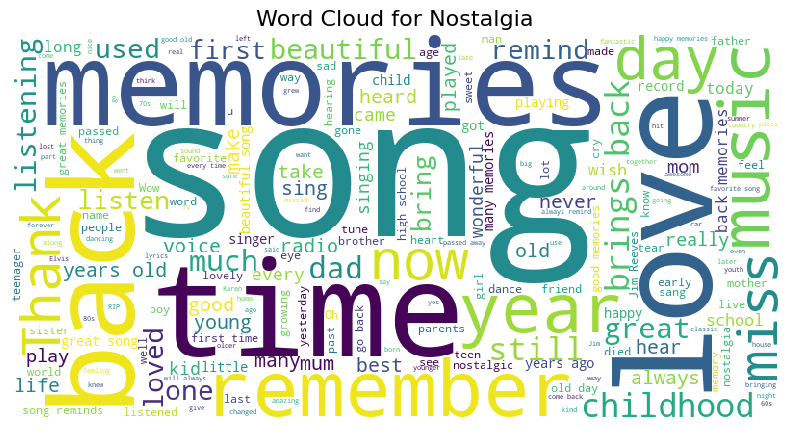

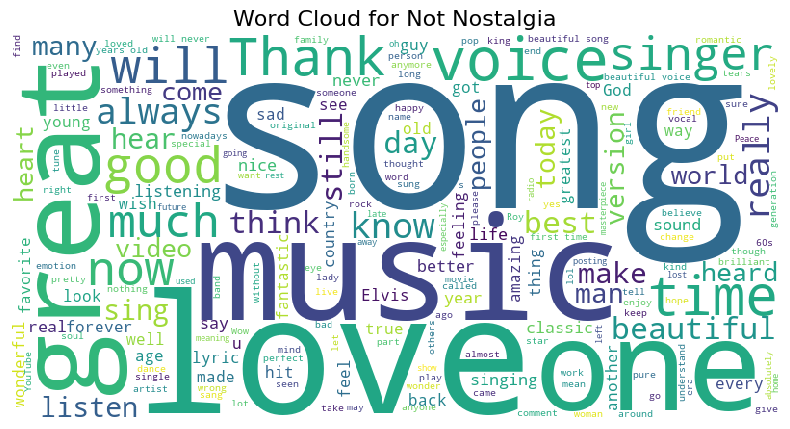

In [217]:
# Word Cloud Visualization
# Useful for visualizing the most frequent words in each category of comments

from wordcloud import WordCloud

# nostalgia sentiment word cloud
nostalgia_comment = " ".join(X_new[X_new['sentiment'] == 'nostalgia']['comment'].dropna().astype(str))
nostalgia_wordcloud = WordCloud(width=800, height=400, background_color='white').generate(nostalgia_comment)
plt.figure(figsize=(10, 5))
plt.imshow(nostalgia_wordcloud, interpolation='nearest')
plt.axis('off')
plt.title('Word Cloud for Nostalgia', fontsize=16)
plt.show()

# not nostalgia sentiment word cloud
not_nostalgia_comment = " ".join(X_new[X_new['sentiment'] == 'not nostalgia']['comment'].dropna().astype(str))
not_nostalgia_wordcloud = WordCloud(width=800, height=400, background_color='white').generate(not_nostalgia_comment)
plt.figure(figsize=(10, 5))
plt.imshow(not_nostalgia_wordcloud, interpolation='nearest')
plt.axis('off')
plt.title('Word Cloud for Not Nostalgia', fontsize=16)
plt.show()

- Generate **TF-IDF features** from the tokens of each text. This will generating a document matrix, however, the weights will be computed differently (using the TF-IDF value of each word per document as opposed to the word frequency). Refer to this Scikit-learn [guide](http://scikit-learn.org/stable/modules/generated/sklearn.feature_extraction.text.TfidfVectorizer.html) .

In [218]:
# Instead of using the CountVectorizer, use the TfidfVectorizer to convert the text data into a term-document matrix.
# however, the weights will be computed differently (using the TF-IDF value of each world per document as opposed to the word frequency.)

from sklearn.feature_extraction.text import TfidfVectorizer

# Create a TfidfVectorizer
tfidf_vect_new = TfidfVectorizer(max_features=300, stop_words='english')
X_tfidf_new = tfidf_vect_new.fit_transform(X_new['comment'])

# Convert the sparse matrix to a DataFrame
tfidf_df_new = pd.DataFrame(X_tfidf_new.toarray(), columns=tfidf_vect_new.get_feature_names_out())

# Display the DataFrame
tfidf_df_new

,10,12,14,15,16,17,1963,1966,20,2019,...,wow,wrong,year,years,yes,yesterday,young,younger,youth,youtube
0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0
1,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.271046,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.143775,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1494,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0
1495,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0
1496,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0
1497,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.192200,0.0,0.0,0.0,0.0,0.0,0.0


- Implement a simple **Naive Bayes classifier** that automatically classifies the records into their categories. Use both the TF-IDF features and word frequency features to build two seperate classifiers. Note that for the TF-IDF features you might need to use other type of NB classifier different than the one in the Master Notebook. Comment on the differences.  Refer to this [article](https://hub.packtpub.com/implementing-3-naive-bayes-classifiers-in-scikit-learn/).

In [224]:
# Split the data into training and testing sets (70% train, 30% test)
X_train_tfidf_new, X_test_tfidf_new, _, _ = train_test_split(tfidf_df_new, X_new['category'], test_size=0.3, random_state=42)

# Here we use the BernoulliNB classifier for the TF-IDF features.
# Since 
from sklearn.naive_bayes import BernoulliNB

# Train the Naive Bayes classifier using the TfidfVectorizer data
nb_classifier_tfidf_new = BernoulliNB()
nb_classifier_tfidf_new.fit(X_train_tfidf_new, y_train_new)

# Make predictions on the test set
y_pred_tfidf_new = nb_classifier_tfidf_new.predict(X_test_tfidf_new)

# Evaluate the classifier
print("Accuracy using TfidfVectorizer:", accuracy_score(y_test_new, y_pred_tfidf_new))
print("\nClassification Report using TfidfVectorizer:\n", classification_report(y_test_new, y_pred_tfidf_new, target_names=target_names_new, digits=4))

Accuracy using TfidfVectorizer: 0.8733333333333333

Classification Report using TfidfVectorizer:
                precision    recall  f1-score   support

not nostalgia     0.8738    0.8618    0.8677       217
    nostalgia     0.8729    0.8841    0.8785       233

     accuracy                         0.8733       450
    macro avg     0.8734    0.8729    0.8731       450
 weighted avg     0.8733    0.8733    0.8733       450



The difference of using the MultinomialNB and BernoulliNB is that:
- Multinomial distribution is useful to model feature vectors where each value represents the number of occurrences of a term or its relative frequency.
- Bernoulli Naive Bayes : Because TF-IDF data is very sparse—lots of values are zero. Even though TF-IDF uses continuous values, it can still act like a yes-or-no signal (showing if a word is meaningfully present or not). This fits Bernoulli’s style, making it a better choice for classification here.

<hr>
<hr>

## 4. Fourth:
In the lab, we applied each step really quickly just to illustrate how to work with your dataset. There are somethings that are not ideal or the most efficient/meaningful. Each dataset can be handled differently as well. What are those inefficent parts you noticed? How can you improve the Data preprocessing for these specific datasets? __This part is worth 10% of your grade.__

Answer:

- Maybe we could try to clean the text data more effectively by removing special characters, numbers, and other irrelevant information.
- We could also try to use more advanced text processing techniques to normalize the text data, like lemmatization or stemming.
- We could experiment with different feature extraction techniques like word embeddings or pre-trained language models.